In [1]:
from fish_helpers import *

In [714]:
import sys
def sizeof_fmt(num, suffix='B'):
    ''' by Fred Cirera,  https://stackoverflow.com/a/1094933/1870254, modified'''
    for unit in ['','Ki','Mi','Gi','Ti','Pi','Ei','Zi']:
        if abs(num) < 1024.0:
            return "%3.1f %s%s" % (num, unit, suffix)
        num /= 1024.0
    return "%.1f %s%s" % (num, 'Yi', suffix)

for name, size in sorted(((name, sys.getsizeof(value)) for name, value in locals().items()),
                         key= lambda x: -x[1])[:10]:
    print("{:>30}: {:>8}".format(name, sizeof_fmt(size)))

                     matrix_df:  3.5 GiB
                         spots:  1.8 GiB
                           _65:  1.8 GiB
                           stk:  1.0 GiB
                          _340: 720.1 MiB
                  spots_sorted: 714.7 MiB
                      spot_pos: 61.4 MiB
                  spot_pixel_x: 61.4 MiB
                  spot_pixel_y: 61.4 MiB
             MERFISH_clustered: 44.2 MiB


In [4]:
md = Metadata('/hybedata/Images/Robert/TBI_v2/sham_m3_slide4_2019Nov04/')

In [ ]:
MERFISH = pd.read_csv('/bigstore/GeneralStorage/Zach/CSI/Hippocampus_sham_m3_segmented_data/Merged.Cells.pixel.Coords.csv.gz')
MERFISH

In [ ]:
# XY were flipped
MERFISH_stage = pd.read_csv('/bigstore/GeneralStorage/Zach/CSI/Hippocampus_sham_m3_segmented_data/Merged.Cells.stage.Coords.csv.gz')
cameradirection=[1,1]
pixelsize = 0.109
index = []
X = []
Y = []
for pos in MERFISH.pos.unique():
    print(pos)
    coordX,coordY = md.image_table[md.image_table.Position==pos].XY.iloc[0]
    pos_temp = MERFISH[MERFISH.pos==pos]
    for i in pos_temp.index:
        index.append(i)
        x = pos_temp.loc[i].x*pixelsize*cameradirection[0]+coordX
        y = pos_temp.loc[i].y*pixelsize*cameradirection[1]+coordY
        X.append(x)
        Y.append(y)
MERFISH_stage['stage_x'] = X
MERFISH_stage['stage_y'] = Y

In [ ]:
# only for 1 hemisphere size limitations
temp_df = MERFISH_stage[MERFISH_stage.stage_y>0]
print(len(temp_df))
xy = np.zeros((len(temp_df),2))
xy[:,0] = np.array(temp_df.stage_x)
xy[:,1] = np.array(temp_df.stage_y)
thresh = np.sqrt(200) #sqrt 10**2 +10**2
clustering = AgglomerativeClustering(n_clusters=None,distance_threshold=thresh).fit(xy)
labels = pd.DataFrame(clustering.labels_,index=temp_df.index)
clustered_MERFISH_stage = pd.DataFrame(index=range(len(np.unique(clustering.labels_))))
non_gene_columns = ['x','y','z','stage_x','stage_y']
gene_columns = [i for i in MERFISH_stage.columns if not i in non_gene_columns]
values_dict = {}
for column in MERFISH_stage.columns:
    values_dict[column] = []
for i in np.unique(clustering.labels_):
    cells = list(labels[labels[0]==i].index)
    for column in non_gene_columns:
        values_dict[column].append(np.average(MERFISH_stage[column].loc[cells]))
    for column in gene_columns:
        values_dict[column].append(np.sum(MERFISH_stage[column].loc[cells]))
for column in MERFISH_stage.columns:
    clustered_MERFISH_stage[column] = values_dict[column]
clustered_MERFISH_stage

In [ ]:
# only for 1 hemisphere size limitations
temp_df = MERFISH_stage[MERFISH_stage.stage_y<0]
print(len(temp_df))
xy = np.zeros((len(temp_df),2))
xy[:,0] = np.array(temp_df.stage_x)
xy[:,1] = np.array(temp_df.stage_y)
thresh = np.sqrt(200) #sqrt 10**2 +10**2
clustering = AgglomerativeClustering(n_clusters=None,distance_threshold=thresh).fit(xy)
labels = pd.DataFrame(clustering.labels_,index=temp_df.index)
clustered_MERFISH_stage2 = pd.DataFrame(index=range(len(np.unique(clustering.labels_))))
non_gene_columns = ['x','y','z','stage_x','stage_y']
gene_columns = [i for i in MERFISH_stage.columns if not i in non_gene_columns]
values_dict = {}
for column in MERFISH_stage.columns:
    values_dict[column] = []
for i in np.unique(clustering.labels_):
    cells = list(labels[labels[0]==i].index)
    for column in non_gene_columns:
        values_dict[column].append(np.average(MERFISH_stage[column].loc[cells]))
    for column in gene_columns:
        values_dict[column].append(np.sum(MERFISH_stage[column].loc[cells]))
for column in MERFISH_stage.columns:
    clustered_MERFISH_stage2[column] = values_dict[column]
clustered_MERFISH_stage2

In [ ]:
A = [clustered_MERFISH_stage,clustered_MERFISH_stage2]
MERFISH_clustered = pd.concat(A,ignore_index=True)
MERFISH_clustered

In [ ]:
MERFISH_clustered.to_csv('/bigstore/GeneralStorage/Zach/CSI/Hippocampus_sham_m3_segmented_data/MERFISH_clustered.csv.gz',compression='gzip')

In [3]:
MERFISH_clustered = pd.read_csv('/bigstore/GeneralStorage/Zach/CSI/Hippocampus_sham_m3_segmented_data/MERFISH_clustered.csv.gz',index_col=0)
MERFISH_clustered.head()

,x,y,z,Sema5a,Ttyh2,Tnfaip8l3,Cacna2d1,Ncan,Spry2,Epb41l4b,...,Rassf3,Prox1,Grm2,Casp8,Plekha5,Selplg,stage_x,stage_y,louvain_r0.5,louvain_r1
0,6014.663727,1107.132364,13.090909,0,0,0,3,5,2,1,...,0,0,0,0,0,0,6394.132364,1114.336273,4,7
1,5106.636071,1767.304571,13.857143,6,1,0,1,12,2,4,...,0,0,0,0,0,0,5155.304571,1811.363929,2,0
2,5027.884769,3434.885846,14.000000,13,7,1,5,18,5,3,...,0,0,0,0,0,0,5346.885846,3366.115231,5,11
3,4555.973250,2721.659750,7.250000,0,0,0,0,13,1,0,...,0,0,0,1,0,0,4844.659750,2783.026750,0,2
4,3711.211867,1850.601333,16.266667,4,2,0,1,21,1,1,...,2,0,0,0,0,0,3902.601333,1870.788133,2,0


In [5]:
pos_stage_x = []
pos_stage_y = []
posnames = []
for pos in md.posnames:
    if 'Pos' in pos:
        posnames.append(pos)
        x,y = md.image_table[md.image_table.Position==pos].XY.iloc[0]
        pos_stage_x.append(x)
        pos_stage_y.append(y)
pos_XY_df = pd.DataFrame(index=posnames)
pos_XY_df['x'] = pos_stage_x
pos_XY_df['y'] = pos_stage_y
pos_XY_df['x_center'] = pos_XY_df['x']+(2048*0.109)/2
pos_XY_df['y_center'] = pos_XY_df['y']+(2048*0.109)/2
pos_XY_df

,x,y,x_center,y_center
Pos1,2411.0,-3087.0,2522.616,-2975.384
Pos2,2411.0,-2876.0,2522.616,-2764.384
Pos9,2622.0,-2876.0,2733.616,-2764.384
Pos3,2411.0,-2665.0,2522.616,-2553.384
Pos10,2622.0,-2665.0,2733.616,-2553.384
Pos19,2833.0,-2665.0,2944.616,-2553.384
Pos34,3044.0,-2665.0,3155.616,-2553.384
Pos51,3255.0,1343.0,3366.616,1454.616
Pos35,3044.0,1343.0,3155.616,1454.616
Pos20,2833.0,1343.0,2944.616,1454.616


In [6]:
cell_pos = []
cell_pixel_x = []
cell_pixel_y = []
pixel_size=0.109
cameradirection = [1,1]
for cell in MERFISH_clustered.index:
    x = MERFISH_clustered['stage_x'].loc[cell]
    y = MERFISH_clustered['stage_y'].loc[cell]
    cp = pd.DataFrame(np.sqrt(((pos_XY_df['x_center']-x)**2)+((pos_XY_df['y_center']-y)**2)).sort_values()).index[0]
    cell_pos.append(cp)
    px = pos_XY_df['x'].loc[cp]
    py = pos_XY_df['y'].loc[cp]
    cx = (x-px)/(pixel_size*cameradirection[0])
    cy = (y-py)/(pixel_size*cameradirection[1])
    cell_pixel_x.append(cx)
    cell_pixel_y.append(cy)
MERFISH_clustered['pos'] = cell_pos
MERFISH_clustered['pixel_x'] = cell_pixel_x
MERFISH_clustered['pixel_y'] = cell_pixel_y
MERFISH_clustered

,x,y,z,Sema5a,Ttyh2,Tnfaip8l3,Cacna2d1,Ncan,Spry2,Epb41l4b,...,Casp8,Plekha5,Selplg,stage_x,stage_y,louvain_r0.5,louvain_r1,pos,pixel_x,pixel_y
0,6014.663727,1107.132364,13.090909,0,0,0,3,5,2,1,...,0,0,0,6394.132364,1114.336273,4,7,Pos290,1707.636364,1773.727273
1,5106.636071,1767.304571,13.857143,6,1,0,1,12,2,4,...,0,0,0,5155.304571,1811.363929,2,0,Pos187,1956.922674,425.357143
2,5027.884769,3434.885846,14.000000,13,7,1,5,18,5,3,...,0,0,0,5346.885846,3366.115231,5,11,Pos214,1778.769231,1147.846154
3,4555.973250,2721.659750,7.250000,0,0,0,0,13,1,0,...,1,0,0,4844.659750,2783.026750,0,2,Pos173,1042.750000,1605.750000
4,3711.211867,1850.601333,16.266667,4,2,0,1,21,1,1,...,0,0,0,3902.601333,1870.788133,2,0,Pos103,143.131498,970.533333
5,4720.964769,2819.000000,14.000000,0,7,0,0,10,1,2,...,0,0,0,4942.000000,3040.035231,2,4,Pos175,1935.779817,92.066337
6,4775.200933,1920.412200,13.600000,5,1,3,7,12,2,4,...,0,1,0,5097.412200,1931.799067,2,0,Pos187,1425.800000,1530.266667
7,5644.806071,944.660786,14.714286,1,8,0,2,17,1,6,...,0,0,5,5809.660786,1062.193929,2,0,Pos265,217.071429,1295.357143
8,5832.316571,1742.118429,13.142857,0,0,1,2,0,1,2,...,0,0,0,6185.118429,1718.683429,1,9,Pos283,1725.857143,1510.857143
9,5139.920000,1852.370312,12.500000,10,0,0,15,25,1,9,...,0,0,0,5240.370312,1778.080000,2,0,Pos207,801.562500,120.000000


In [7]:
MERFISH_clustered.to_csv('/bigstore/GeneralStorage/Zach/CSI/Hippocampus_sham_m3_segmented_data/MERFISH_clustered.csv.gz',compression='gzip')

In [35]:
def find_intensities(temp_df,md,blur=10):
    pos = temp_df.pos.iloc[0]
    stk = md.stkread(Position=pos,Channel='DeepBlue',acq= [i for i in md.acqnames if 'nucstain' in i])
    img = np.sum(stk,axis=2).astype('float64')
    blur = filters.gaussian(img,blur)
    Intensity = []
    for cell in temp_df.index:
        y = int(temp_df['pixel_x'].loc[cell])
        x = int(temp_df['pixel_y'].loc[cell])
        Intensity.append(blur[x,y])
    temp_df['nuclear intensity'] = Intensity
    return temp_df

In [ ]:
import tqdm.notebook as tqdm
from multiprocessing import Pool
import sys
from functools import partial
sys.stdout.flush()
pfunc = partial(find_intensities,md=md)
Input = [MERFISH_clustered[MERFISH_clustered.pos==pos] for pos in MERFISH_clustered.pos.unique()]
temp_dfs = []
with Pool(30) as p:
    for temp_df in tqdm.tqdm(p.imap(pfunc,Input,chunksize=1),total=len(Input)):
        temp_dfs.append(temp_df)
sys.stdout.flush()
MERFISH_clustered['Nuclear Intensity'] = pd.concat(temp_dfs)['nuclear intensity']
MERFISH_clustered

In [ ]:
MERFISH_clustered.to_csv('/bigstore/GeneralStorage/Zach/CSI/Hippocampus_sham_m3_segmented_data/MERFISH_clustered.csv.gz',compression='gzip')

In [9]:
spots = pd.read_csv('/scratch/sham_m3_slide4_zach_export.csv',index_col=0)
spots

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


,gene,ave,z,CoordX,CoordY
0,Gad2,21.937500,2,2437.541500,-3086.891000
1,Nes,25.125000,2,2594.256250,-3086.673000
2,Casp8,19.833333,2,2590.414000,-3086.618500
3,Gfra1,41.450000,2,2606.197200,-3086.629400
4,Fezf2,57.678571,2,2552.762286,-3086.439429
5,Fibcd1,28.750000,2,2615.211500,-3086.509500
6,Runx2,15.875000,2,2486.700500,-3086.073500
7,Samd5,34.375000,2,2563.491000,-3086.073500
8,Cntn5,33.000000,2,2535.096500,-3085.964500
9,Tnfaip8l3,38.125000,2,2508.282500,-3085.637500


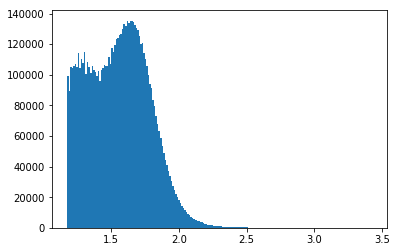

In [159]:
plt.hist(np.log10(spots.ave),bins=200)
plt.show()

In [10]:
def assign_spots(temp_spots_df,MERFISH_clustered,rad=100,step=0.4):
    spots_XY = np.zeros((len(temp_spots_df),3))
    spots_XY[:,0] = temp_spots_df['CoordX']
    spots_XY[:,1] = temp_spots_df['CoordY']
    spots_XY[:,2] = temp_spots_df['z']*0.4
    
    x_min = np.min(spots_XY[:,0])-rad
    x_max = np.max(spots_XY[:,0])+rad
    y_min = np.min(spots_XY[:,1])-rad
    y_max = np.max(spots_XY[:,1])+rad
    temp_cell_df = MERFISH_clustered[(MERFISH_clustered['stage_x']>x_min)&
                          (MERFISH_clustered['stage_x']<x_max)&
                          (MERFISH_clustered['stage_y']>y_min)&
                          (MERFISH_clustered['stage_y']<y_max)]
    cell_XY = np.zeros((len(temp_cell_df),3))
    cell_XY[:,0] = temp_cell_df['stage_x']
    cell_XY[:,1] = temp_cell_df['stage_y']
    cell_XY[:,2] = temp_cell_df['z']*0.4

    cells = []
    distance_list = []
    for i in range(spots_XY.shape[0]):
        distances = np.sqrt(np.sum((cell_XY-spots_XY[i,:])**2,axis=1))
        min_distance = np.min(distances)
        cell = np.where(distances==np.min(distances))[0][0]
        cells.append(temp_cell_df.index[cell])
        distance_list.append(min_distance)
    temp_spots_df['cell'] = cells
    temp_spots_df['distance'] = distance_list
    return temp_spots_df
import tqdm.notebook as tqdm
from multiprocessing import Pool
import sys
from functools import partial
sys.stdout.flush()
pfunc = partial(assign_spots,MERFISH_clustered=MERFISH_clustered)
spots_sorted = spots.sort_values('CoordX')
chunksize = 10000
Input = []
for i in range(int(len(spots_sorted)/chunksize)+1):
    temp_spots_df = spots_sorted.iloc[i*chunksize:(i*chunksize)+chunksize]
    Input.append(temp_spots_df)
temp_dfs = []
with Pool(30) as p:
    for temp_df in tqdm.tqdm(p.imap(pfunc,Input,chunksize=1),total=len(Input)):
        temp_dfs.append(temp_df)
sys.stdout.flush()
temp = pd.concat(temp_dfs)
spots['cell'] = temp['cell']
spots['distance'] = temp['distance']


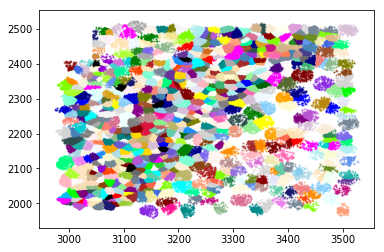

In [16]:
import matplotlib.colors as mcolors
import random
colors = mcolors.CSS4_COLORS
temp = spots[(spots['CoordX']>3000)&
                     (spots['CoordX']<3500)&
                     (spots['CoordY']>2000)&
                     (spots['CoordY']<2500)]
# cells = random.sample(list(temp.cell.unique()),1000)
cells = temp.cell.unique()
for cell in cells:
    color = colors[random.sample(list(colors.keys()),1)[0]]
    temp_df = spots[(spots.cell==cell)&(spots.distance<20)]
    plt.scatter(temp_df['CoordX'],temp_df['CoordY'],c=color,s=1,alpha=0.5)
    plt.scatter(MERFISH_clustered['stage_x'].loc[cell],MERFISH_clustered['stage_y'].loc[cell],c=color,s=5,alpha=0.5)
plt.show()

In [19]:
# Cells info df
cell_info_df = pd.DataFrame(index=MERFISH_clustered.index)
cell_info_df['stage_x'] = MERFISH_clustered['stage_x']
cell_info_df['stage_y'] = MERFISH_clustered['stage_y']
cell_info_df['pos'] = MERFISH_clustered['pos']
cell_info_df['pixel_x'] = MERFISH_clustered['pixel_x']
cell_info_df['pixel_y'] = MERFISH_clustered['pixel_y']
cell_info_df['z'] = MERFISH_clustered['z']
# cell_info_df['nuclear intensity'] = MERFISH_clustered['Nuclear Intensity']
cell_info_df

,stage_x,stage_y,pos,pixel_x,pixel_y,z
0,6394.132364,1114.336273,Pos290,1707.636364,1773.727273,13.090909
1,5155.304571,1811.363929,Pos187,1956.922674,425.357143,13.857143
2,5346.885846,3366.115231,Pos214,1778.769231,1147.846154,14.000000
3,4844.659750,2783.026750,Pos173,1042.750000,1605.750000,7.250000
4,3902.601333,1870.788133,Pos103,143.131498,970.533333,16.266667
5,4942.000000,3040.035231,Pos175,1935.779817,92.066337,14.000000
6,5097.412200,1931.799067,Pos187,1425.800000,1530.266667,13.600000
7,5809.660786,1062.193929,Pos265,217.071429,1295.357143,14.714286
8,6185.118429,1718.683429,Pos283,1725.857143,1510.857143,13.142857
9,5240.370312,1778.080000,Pos207,801.562500,120.000000,12.500000


In [69]:
cell_info_df.to_csv('/bigstore/GeneralStorage/Zach/CSI/cell_info_df.csv.gz',compression='gzip')

In [20]:
# Cells scMatrix df
cell_counts_df = pd.DataFrame(index=MERFISH_clustered.index)
genes = spots.gene.unique()
genes.sort()
for gene in tqdm.tqdm(genes):
    temp_df = spots[spots.gene==gene]
    counts = Counter(temp_df.cell)
    c = []
    for cell in cell_counts_df.index:
        if cell in counts.keys():
            c.append(counts[cell])
        else:
            c.append(0)
    cell_counts_df[gene] = c
cell_counts_df

,A730060N03Rik,A830036E02Rik,Abcb1a,Adamts9,Aqp4,Arap2,Arhgap45,Asb7,Atf6,Bbs1,...,blank16,blank17,blank2,blank3,blank4,blank5,blank6,blank7,blank8,blank9
0,0,0,0,1,0,1,0,0,0,0,...,0,2,0,0,1,0,0,0,0,0
1,0,1,0,0,1,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0
2,0,1,0,1,0,2,0,0,6,10,...,0,2,0,0,3,0,0,0,0,4
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,1,1,1,0,6,1,...,0,3,0,0,3,0,0,0,1,1
5,0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,0,4,0,0,3,0,...,0,2,0,0,0,0,0,0,0,0
7,0,0,0,0,1,2,0,1,3,1,...,1,2,0,0,1,0,0,0,0,1
8,0,0,0,0,0,2,0,0,2,0,...,0,1,1,0,0,0,0,0,0,0
9,0,0,0,0,0,0,1,0,0,1,...,1,0,0,0,1,0,0,0,0,0


In [140]:
#Cells scMatrix df
cell_counts_df = pd.DataFrame(index=MERFISH_clustered.index)
genes = spots.gene.unique()
genes.sort()
for gene in tqdm.tqdm(genes):
    temp_df = spots[(spots.gene==gene)&(spots.distance<20)]
    counts = Counter(temp_df.cell)
    c = []
    for cell in cell_counts_df.index:
        if cell in counts.keys():
            c.append(counts[cell])
        else:
            c.append(0)
    cell_counts_df[gene] = c
cell_counts_df

,A730060N03Rik,A830036E02Rik,Abcb1a,Adamts9,Aqp4,Arap2,Arhgap45,Asb7,Atf6,Bbs1,...,blank16,blank17,blank2,blank3,blank4,blank5,blank6,blank7,blank8,blank9
0,0,0,0,1,0,1,0,0,0,0,...,0,2,0,0,1,0,0,0,0,0
1,0,1,0,0,1,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0
2,0,1,0,1,0,2,0,0,6,10,...,0,2,0,0,3,0,0,0,0,4
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,1,1,1,0,6,1,...,0,3,0,0,3,0,0,0,1,1
5,0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,0,4,0,0,3,0,...,0,2,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,1,2,0,0,1,0,0,0,0,0
8,0,0,0,0,0,2,0,0,2,0,...,0,1,1,0,0,0,0,0,0,0
9,0,0,0,0,0,0,1,0,0,1,...,1,0,0,0,1,0,0,0,0,0


In [142]:
cell_counts_df.to_csv('/bigstore/GeneralStorage/Zach/CSI/cell_counts_df.csv.gz',compression='gzip')

217.0


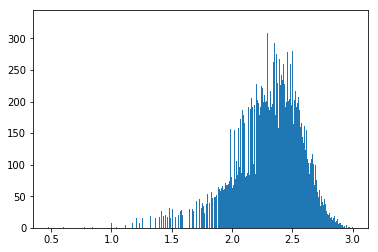

In [141]:
ss = np.sum(cell_counts_df,axis=1)
print(np.median(ss))
plt.hist(np.log10(ss+1),bins=500)
plt.show()

opening img_Pos1_000000032_000000000_FarRed_000_032.tif

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if sys.path[0] == '':


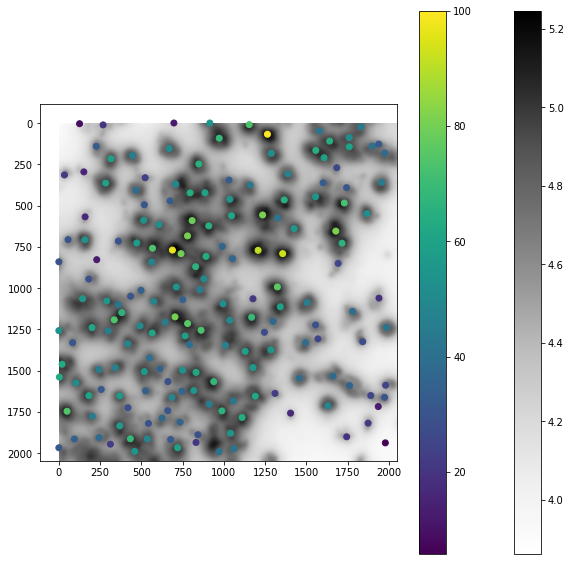

In [55]:
blur = 10
def find_intensities(temp_df,md,blur=10,color='DeepBlue',acq='nucstain',verbose=False):
    pos = temp_df.pos.iloc[0]
    stk = md.stkread(Position=pos,Channel=color,acq= [i for i in md.acqnames if acq in i])
    img = np.sum(stk,axis=2).astype('float64')
    blur = filters.gaussian(img,blur)
    Intensity = []
    for cell in temp_df.index:
        y = int(temp_df['pixel_x'].loc[cell])
        x = int(temp_df['pixel_y'].loc[cell])
        Intensity.append(blur[x,y])
    temp_df['nuclear intensity'] = Intensity
    if verbose:
        plt.figure(figsize=[10,10])
        plt.imshow(np.log10(blur),cmap='Greys')
        plt.colorbar()
        plt.scatter(temp_df.pixel_x,temp_df.pixel_y,c=100*temp_df['nuclear intensity']/np.max(temp_df['nuclear intensity']))
        plt.colorbar()
        plt.show()
    return temp_df
temp_df = find_intensities(temp_df,md,blur=blur,color='FarRed',acq='hybe1',verbose=True)


opening img_Pos1_000000007_000000000_DeepBlue_000_007.tif

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if sys.path[0] == '':


opening img_Pos1_000000032_000000000_DeepBlue_000_032.tif

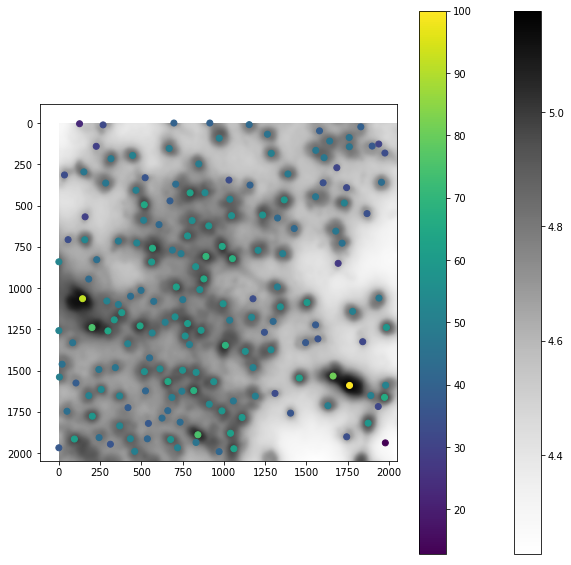

In [53]:
blur = 10
temp_df = find_intensities(temp_df,md,blur=blur,color='DeepBlue',acq='nucstain')
pos = 'Pos1'
stk = md.stkread(Position=pos,Channel='DeepBlue',acq= [i for i in md.acqnames if 'nucstain' in i])
img = np.sum(stk,axis=2).astype('float64')
blur = filters.gaussian(img,blur)
plt.figure(figsize=[10,10])
plt.imshow(np.log10(blur),cmap='Greys')
plt.colorbar()
plt.scatter(temp_df.pixel_x,temp_df.pixel_y,c=100*temp_df['nuclear intensity']/np.max(temp_df['nuclear intensity']))
plt.colorbar()
plt.show()

In [65]:
spot_pos = []
spot_pixel_x = []
spot_pixel_y = []
pixel_size=0.109
cameradirection = [1,1]
for spot in tqdm.tqdm(spots.index):
    x = spots['CoordX'].loc[spot]
    y = spots['CoordY'].loc[spot]
    cp = cell_info_df['pos'].loc[spots['cell'].loc[spot]]
    spot_pos.append(cp)
    px = pos_XY_df['x'].loc[cp]
    py = pos_XY_df['y'].loc[cp]
    cx = (x-px)/(pixel_size*cameradirection[0])
    cy = (y-py)/(pixel_size*cameradirection[1])
    spot_pixel_x.append(cx)
    spot_pixel_y.append(cy)
spots['pos'] = spot_pos
spots['pixel_x'] = spot_pixel_x
spots['pixel_y'] = spot_pixel_y
spots

,gene,ave,z,CoordX,CoordY,cell,distance,pos,pixel_x,pixel_y
0,Gad2,21.937500,2,2437.541500,-3086.891000,15561,6.370279,Pos1,243.500000,1.000000
1,Nes,25.125000,2,2594.256250,-3086.673000,29263,12.835393,Pos1,1681.250000,3.000000
2,Casp8,19.833333,2,2590.414000,-3086.618500,26933,11.797205,Pos1,1646.000000,3.500000
3,Gfra1,41.450000,2,2606.197200,-3086.629400,19727,8.652330,Pos1,1790.800000,3.400000
4,Fezf2,57.678571,2,2552.762286,-3086.439429,18880,9.265749,Pos1,1300.571429,5.142857
5,Fibcd1,28.750000,2,2615.211500,-3086.509500,19727,8.864461,Pos1,1873.500000,4.500000
6,Runx2,15.875000,2,2486.700500,-3086.073500,22147,5.684166,Pos1,694.500000,8.500000
7,Samd5,34.375000,2,2563.491000,-3086.073500,18880,16.770466,Pos1,1399.000000,8.500000
8,Cntn5,33.000000,2,2535.096500,-3085.964500,20726,5.075030,Pos1,1138.500000,9.500000
9,Tnfaip8l3,38.125000,2,2508.282500,-3085.637500,29128,5.559781,Pos1,892.500000,12.500000


In [71]:
spots.to_csv('/bigstore/GeneralStorage/Zach/CSI/spots.csv.gz',compression='gzip')

opening img_Pos1_000000032_000000000_FarRed_000_032.tif

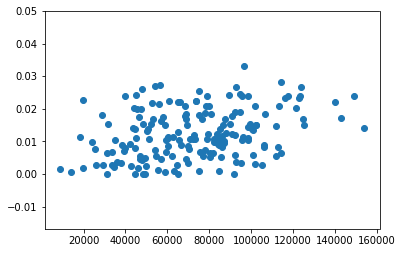

0.30742158893561816


In [87]:
pos = temp_df.pos.iloc[0]
color = 'FarRed'
acq = 'hybe1'
stk = md.stkread(Position=pos,Channel=color,acq= [i for i in md.acqnames if acq in i])
img = np.sum(stk,axis=2).astype('float64')
blur = filters.gaussian(img,10)
temp_spots = spots[spots.pos=='Pos1']
fake_img = np.histogram2d(temp_spots['CoordX'],temp_spots['CoordY'],bins=2048)[0]
fake_img = filters.gaussian(fake_img,30)
Intensity_img = []
Intensity_2d = []
for cell in temp_df.index:
    y = int(temp_df['pixel_x'].loc[cell])
    x = int(temp_df['pixel_y'].loc[cell])
    Intensity_img.append(blur[x,y])
    Intensity_2d.append(fake_img[x,y])
plt.scatter(Intensity_img,Intensity_2d)
plt.show()
print(spearmanr(Intensity_img,Intensity_2d)[0])

In [94]:
def adjust(img):
    temp = img.copy()
    tmin = np.percentile(temp.ravel(),1)
    temp[temp<tmin]=tmin
    tmax = np.percentile(temp.ravel(),99)
    temp[temp>tmax]=tmax
    return temp
def show(img1,img2):
    plt.figure(figsize=[10,10])
    plt.subplot(1,2,1)
    plt.imshow(adjust(img1),cmap='inferno')
    plt.subplot(1,2,2)
    plt.imshow(adjust(img2),cmap='inferno')
    plt.show()

In [ ]:
codebook_pth = '/bigstore/GeneralStorage/Rob/merfish/MERFISH_analysis-master/mouse/Doug/Hippocampus/HippocampusCodebookFinalPass2.txt'
codewords = pd.read_csv(codebook_pth,skiprows=3)
codewords.columns = ['name', 'id', 'barcode']
binary = np.zeros((len(codewords),18))
for y,barcode in enumerate(codewords.barcode):
    for x,b in enumerate(str(barcode).zfill(18)):
        binary[y,x]=b
binary_df = pd.DataFrame(binary,index=list(codewords['name']))

In [684]:
from scipy.stats import pearsonr
from segmentation_3D import *
def convert2compressed(temp_df,md,blur=40):
    bitmap = [('RS0095_cy5', 'hybe1', 'FarRed'), ('RS0109_cy5', 'hybe3', 'FarRed'),
              ('RS0175_cy5', 'hybe5', 'FarRed'), ('RS0237_cy5', 'hybe7', 'FarRed'),
              ('RS0307_cy5', 'hybe2', 'FarRed'), ('RS0332_cy5', 'hybe4', 'FarRed'),
              ('RSN9927.0_cy5', 'hybe8', 'FarRed'), ('RSN2336.0_cy5', 'hybe6', 'FarRed'), 
              ('RSN1807.0_cy5', 'hybe9', 'FarRed'),
              ('RS0384_atto565', 'hybe4', 'Orange'), ('RS0406_atto565', 'hybe5', 'Orange'),
              ('RS0451_atto565', 'hybe3', 'Orange'), ('RS0468_atto565', 'hybe2', 'Orange'),
              ('RS0548_atto565', 'hybe1', 'Orange'), ('RS64.0_atto565', 'hybe7', 'Orange'),
              ('RSN4287.0_atto565', 'hybe6', 'Orange'), 
              ('RSN1252.0_atto565', 'hybe9', 'Orange'), ('RSN9535.0_atto565', 'hybe8', 'Orange')]
    pos = temp_df.pos.iloc[0]
    compressed_measurement = np.zeros((len(temp_df),18))
    for bit,bit_data in enumerate(bitmap):
        rp,hybe,color = bit_data
        acq = [i for i in md.acqnames if hybe in i]
        stk = md.stkread(Position=pos,Channel=color,acq=acq).astype('float64')
        img = np.sum(stk,axis=2)
        blurred = filters.gaussian(img, int(blur))
        for i,cell in enumerate(temp_df.index):
            y = temp_df['pixel_x'].loc[cell]
            x = temp_df['pixel_y'].loc[cell]
            compressed_measurement[i,bit] = blurred[int(x),int(y)]
    compressed_df = pd.DataFrame(compressed_measurement,index=temp_df.index)
    return compressed_df

opening img_Pos3_000000032_000000000_Orange_000_032.tif
spearman 0.6456
pearson 0.6713


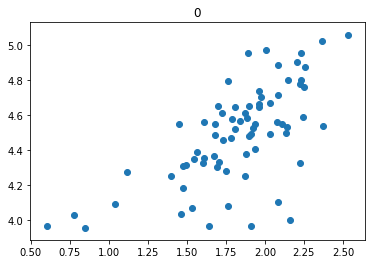


spearman 0.5713
pearson 0.6015


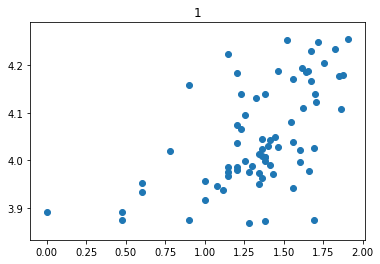


spearman 0.4821
pearson 0.4936


/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in log10
  if sys.path[0] == '':


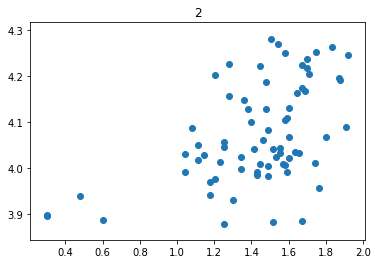


spearman 0.3192
pearson 0.366


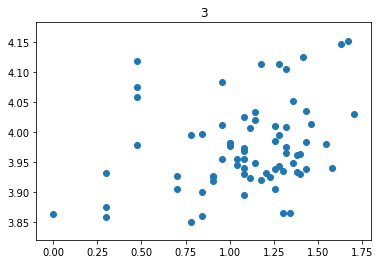


spearman 0.4715
pearson 0.5016


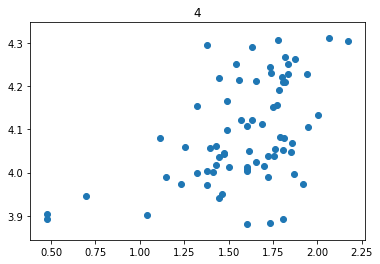


spearman 0.5719
pearson 0.62


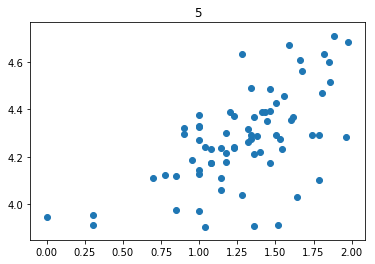


spearman 0.341
pearson 0.3591


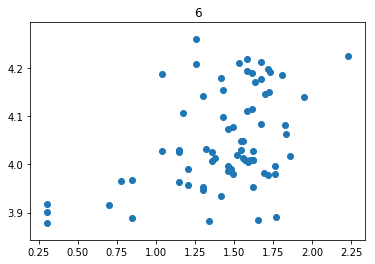


spearman 0.4196
pearson 0.5257


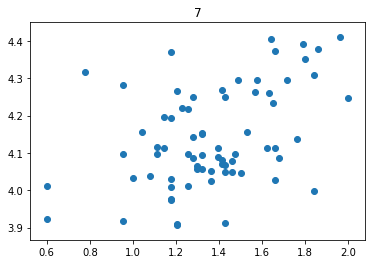


spearman 0.359
pearson 0.358


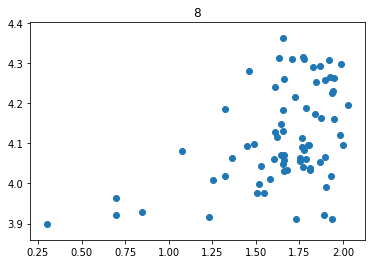


spearman 0.5921
pearson 0.6099


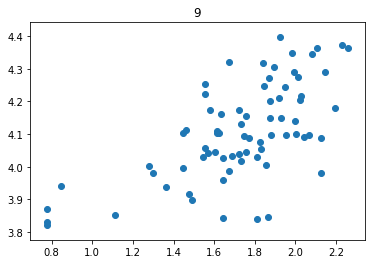


spearman 0.4398
pearson 0.4038


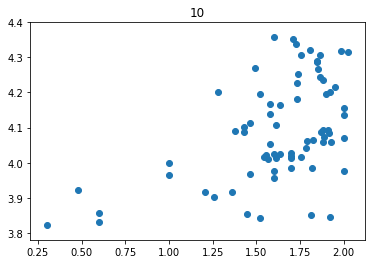


spearman 0.4199
pearson 0.5101


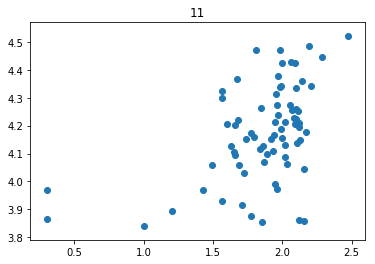


spearman 0.6798
pearson 0.7065


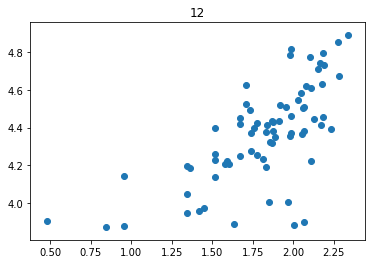


spearman 0.3651
pearson 0.3707


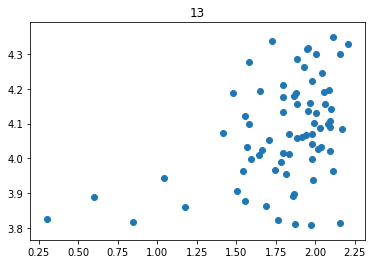


spearman 0.5749
pearson 0.6405


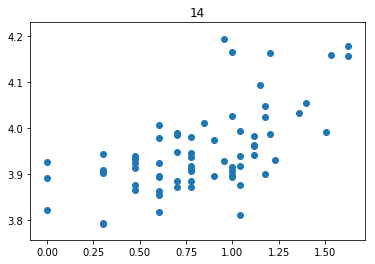


spearman 0.5625
pearson 0.5874


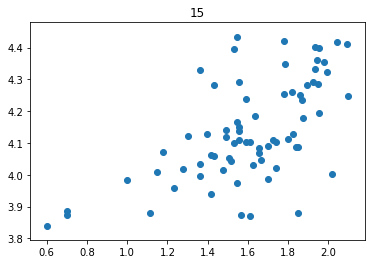


spearman 0.412
pearson 0.4752


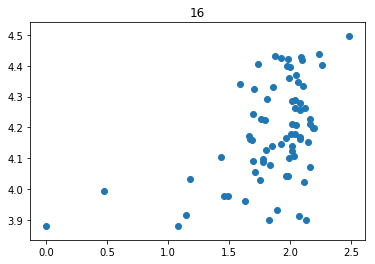


spearman 0.3974
pearson 0.359


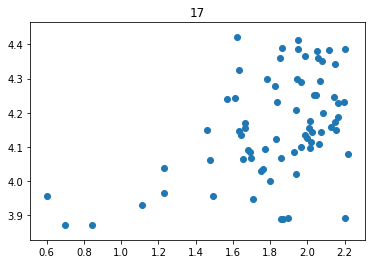

In [685]:
pos='Pos3'
temp_df = cell_info_df[cell_info_df.pos==pos]
compressed_df = convert2compressed(temp_df,md,blur=10)
temp_counts_df = cell_counts_df.loc[temp_df.index]
for i in compressed_df.columns:
    intensities = compressed_df[i]
    temp_gene_col = list(binary_df[binary_df[i]==1].index)
    counts = np.sum(temp_counts_df[temp_gene_col],axis=1)
    print('')
    print('spearman',round(spearmanr(intensities,counts)[0],4))
    print('pearson',round(pearsonr(intensities,counts)[0],4))
    plt.scatter(np.log10(counts),np.log10(intensities))
    plt.title(i)
    plt.show()

In [705]:
import tqdm.notebook as tqdm
from multiprocessing import Pool
import sys
from functools import partial
sys.stdout.flush()
pfunc = partial(convert2compressed,md=md,blur=10)
Input = [cell_info_df[cell_info_df.pos==pos] for pos in cell_info_df.pos.unique()]
temp_dfs = []
with Pool(30) as p:
    for temp_df in tqdm.tqdm(p.imap(pfunc,Input,chunksize=1),total=len(Input)):
        temp_dfs.append(temp_df)
sys.stdout.flush()
compressed_df = pd.concat(temp_dfs)
compressed_df

opening img_Pos71_000000032_000000000_FarRed_000_032.tiff

MemoryError: 

In [ ]:
compressed_df2.to_csv('/bigstore/GeneralStorage/Zach/CSI/compressed_df2.csv.gz',compression='gzip')


spearman 0.7652
pearson 0.6917


/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log10
  # Remove the CWD from sys.path while we load stuff.


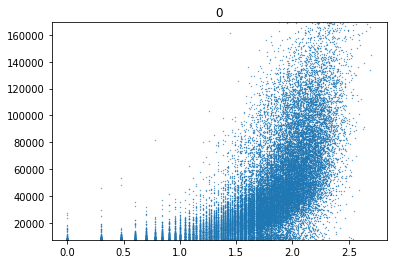


spearman 0.5635
pearson 0.3546


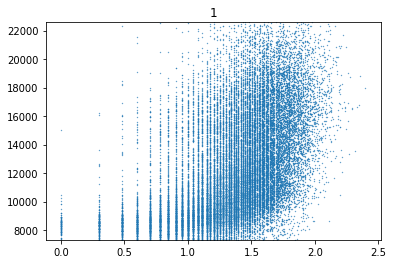


spearman 0.585
pearson 0.3606


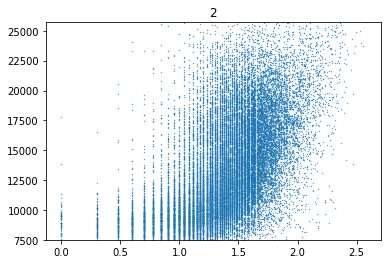


spearman 0.2015
pearson 0.2354


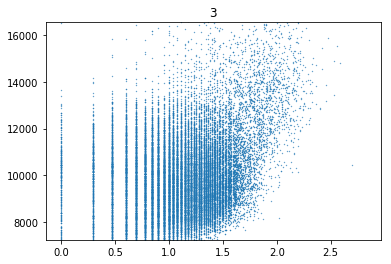


spearman 0.5354
pearson 0.3721


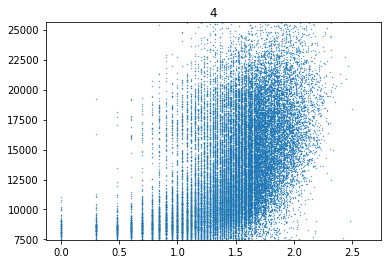


spearman 0.6644
pearson 0.5728


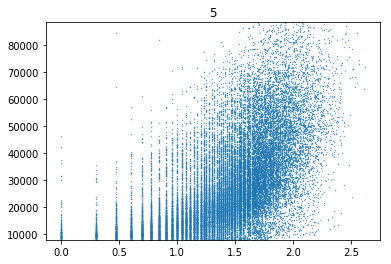


spearman 0.4365
pearson 0.2524


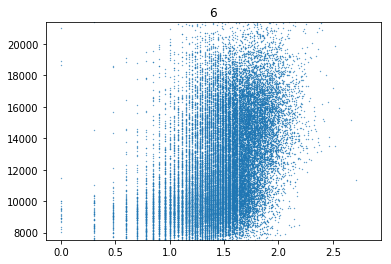


spearman 0.551
pearson 0.3591


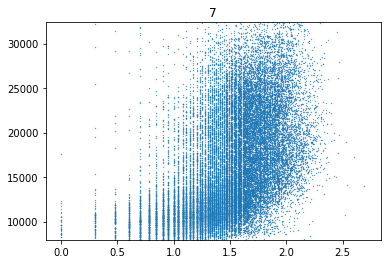


spearman 0.28
pearson 0.1678


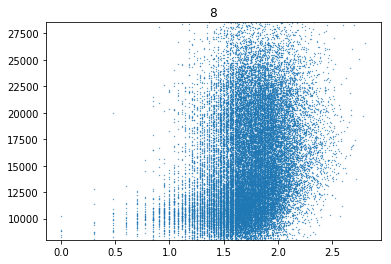


spearman 0.718
pearson 0.567


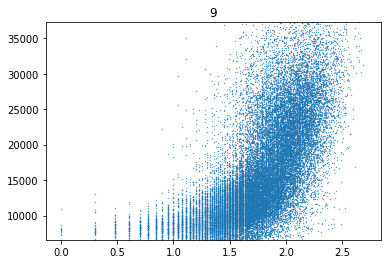


spearman 0.5336
pearson 0.3714


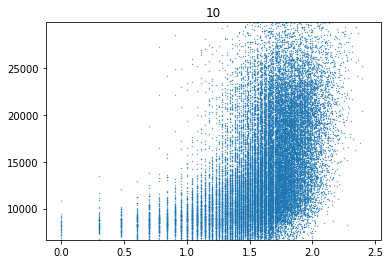


spearman 0.4043
pearson 0.2868


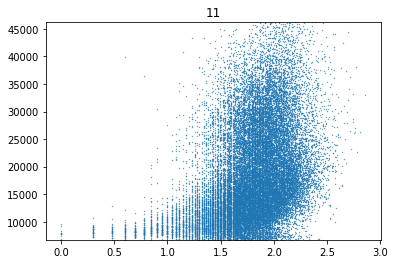


spearman 0.6249
pearson 0.5078


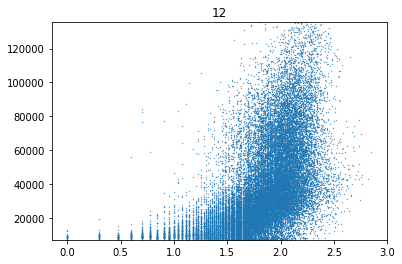


spearman 0.3168
pearson 0.1908


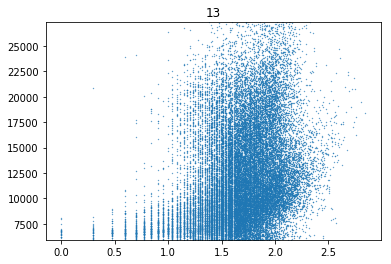


spearman 0.3653
pearson 0.2925


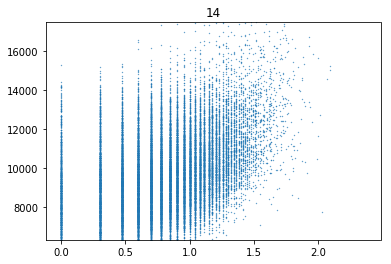


spearman 0.6345
pearson 0.4589


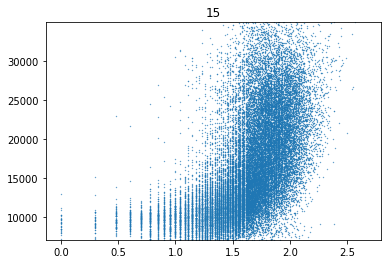


spearman 0.3873
pearson 0.2755


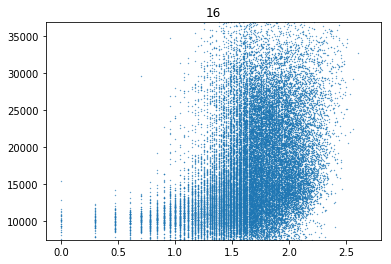


spearman 0.4721
pearson 0.3541


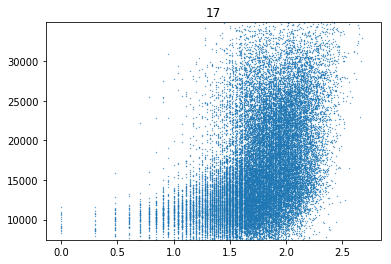

In [146]:
compressed_df = compressed_df.sort_index()
cell_counts_df = cell_counts_df.sort_index()
for i in compressed_df.columns:
    intensities = compressed_df[i]
    temp_gene_col = list(binary_df[binary_df[i]==1].index)
    counts = np.sum(cell_counts_df[temp_gene_col],axis=1)
    print('')
    print('spearman',round(spearmanr(intensities,counts)[0],4))
    print('pearson',round(pearsonr(intensities,counts)[0],4))
    plt.scatter(np.log10(counts),intensities,s=0.1)
    plt.ylim([np.percentile(intensities,1),np.percentile(intensities,99)])
    plt.title(i)
    plt.show()

In [240]:
border_xy = 100
border_z = 5
keepers = cell_info_df[(cell_info_df.z>0+border_z)&
                       (cell_info_df.z<cell_info_df.z.max()-border_z)&
                       (cell_info_df.pixel_x>0+border_xy)&
                       (cell_info_df.pixel_x<2048-border_xy)&
                       (cell_info_df.pixel_y>0+border_xy)&
                       (cell_info_df.pixel_y<2048-border_xy)].index

2.0


spearman 0.7921
pearson 0.7094


/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in log10


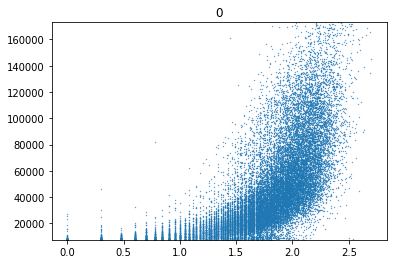


spearman 0.5836
pearson 0.352


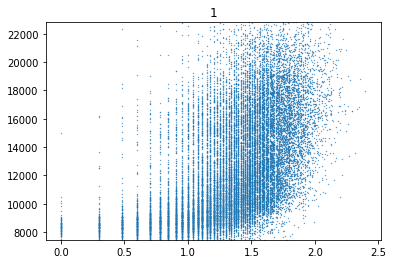


spearman 0.6087
pearson 0.3633


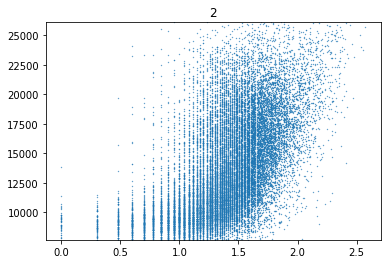


spearman 0.1955
pearson 0.2437


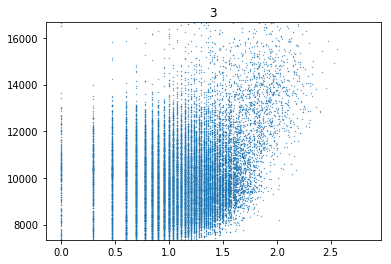


spearman 0.5549
pearson 0.3723


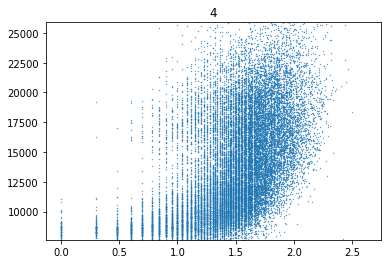


spearman 0.6976
pearson 0.5992


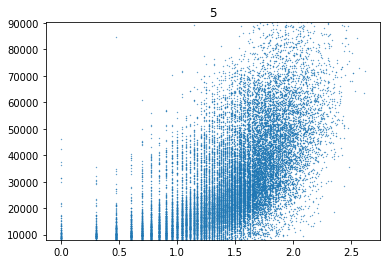


spearman 0.4533
pearson 0.2596


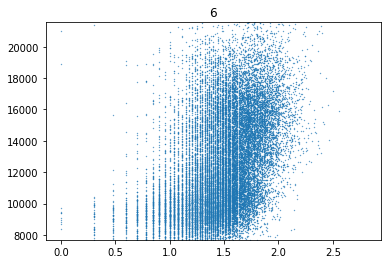


spearman 0.5711
pearson 0.3656


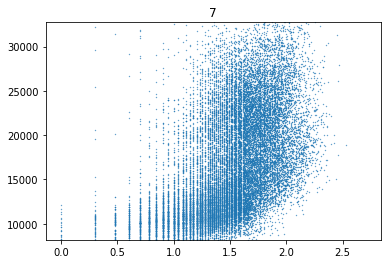


spearman 0.2895
pearson 0.1682


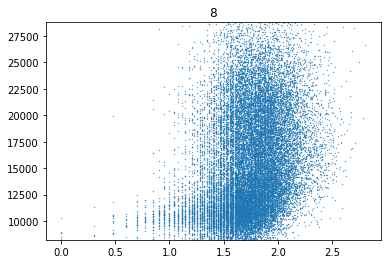


spearman 0.7418
pearson 0.5808


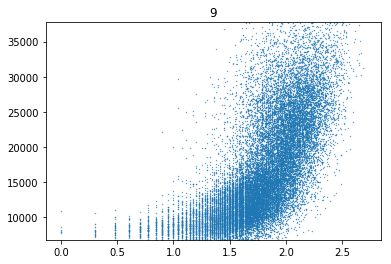


spearman 0.5472
pearson 0.3711


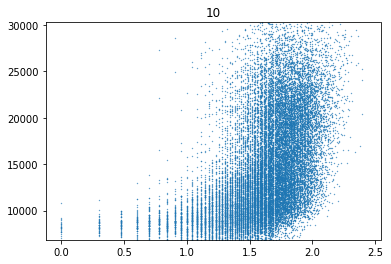


spearman 0.4162
pearson 0.2868


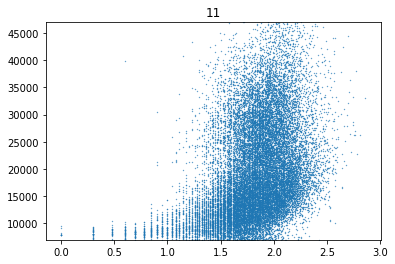


spearman 0.6487
pearson 0.5182


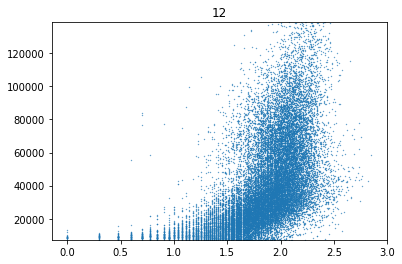


spearman 0.3238
pearson 0.1877


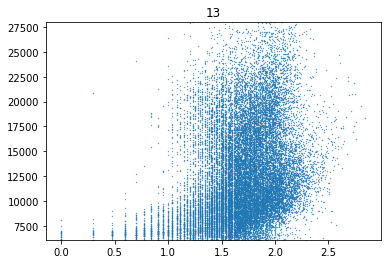


spearman 0.3632
pearson 0.2844


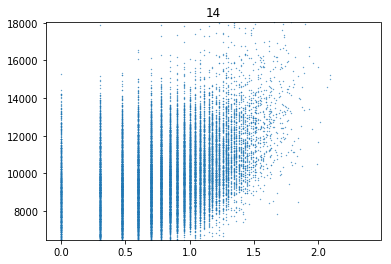


spearman 0.6567
pearson 0.4658


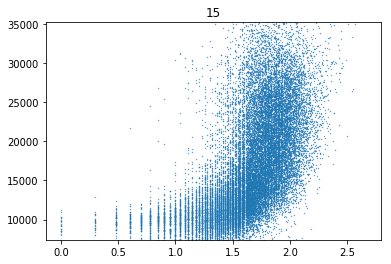


spearman 0.3941
pearson 0.2724


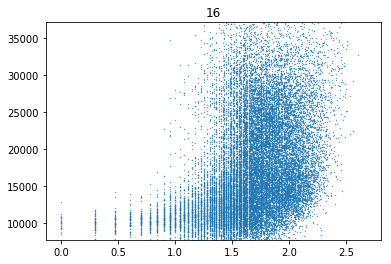


spearman 0.4867
pearson 0.3581


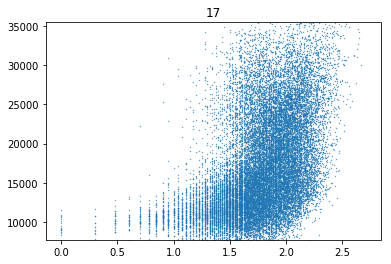

In [246]:
border_xy = 100
border_z = 5
compressed_df = compressed_df.sort_index()
cell_counts_df = cell_counts_df.sort_index()
keepers = cell_info_df[(cell_info_df.z>0+border_z)&
                       (cell_info_df.z<cell_info_df.z.max()-border_z)&
                       (cell_info_df.pixel_x>0+border_xy)&
                       (cell_info_df.pixel_x<2048-border_xy)&
                       (cell_info_df.pixel_y>0+border_xy)&
                       (cell_info_df.pixel_y<2048-border_xy)].index
for i in compressed_df.columns:
    intensities = compressed_df[i].loc[keepers]
    temp_gene_col = list(binary_df[binary_df[i]==1].index)
    counts = np.sum(cell_counts_df[temp_gene_col],axis=1).loc[keepers]
    print('')
    print('spearman',round(spearmanr(intensities,counts)[0],4))
    print('pearson',round(pearsonr(intensities,counts)[0],4))
    plt.scatter(np.log10(counts),intensities,s=0.1)
    plt.ylim([np.percentile(intensities,1),np.percentile(intensities,99)])
    plt.title(i)
    plt.show()

In [247]:
len(keepers)

23593

In [135]:
import pickle
import pandas as pd
matrix = pickle.load(open('/bigstore/binfo/mouse/Hippocampus/TBI.SHAM.countdata.with.celltypes.normalized.pkl','rb'))
latent = pd.read_csv('/bigstore/binfo/mouse/Hippocampus/TBI.SHAM.countdata.with.celltypes.latent.csv.gz',index_col=0)
genes = pd.read_csv('/bigstore/binfo/mouse/Hippocampus/TBI.SHAM.countdata.with.celltypes.genes.csv',index_col=0)
info_df = pd.read_csv('/bigstore/binfo/mouse/Hippocampus/TBI.SHAM.countdata.with.celltypes.info_df.csv',index_col=0)
matrix_df = pd.DataFrame(matrix.T,index=genes.index,columns=info_df.index)
compressed = pd.DataFrame(index=matrix_df.columns)
probed_expression_matrix = matrix_df.loc[list(codewords.name)]
temp_matrix = np.array(probed_expression_matrix)
for i in range(18):
    compressed[i] = np.nansum(np.multiply(temp_matrix,binary[:,i][...,None]),axis=0)
scRNAseq_compressed = compressed

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:9: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  if __name__ == '__main__':


In [147]:
compressed = pd.DataFrame(index=cell_counts_df.index)
for i in range(18):
    genes = list(binary_df[binary_df[i]==1].index)
    compressed[i] = np.sum(cell_counts_df[genes],axis=1)
MERFISH_compressed = compressed

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in log10
/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log10


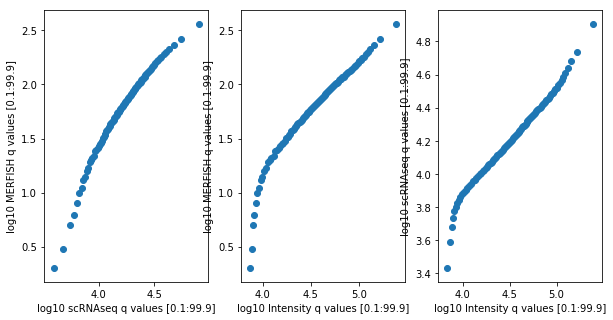

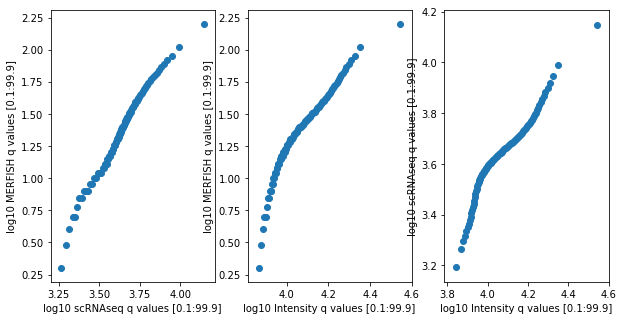

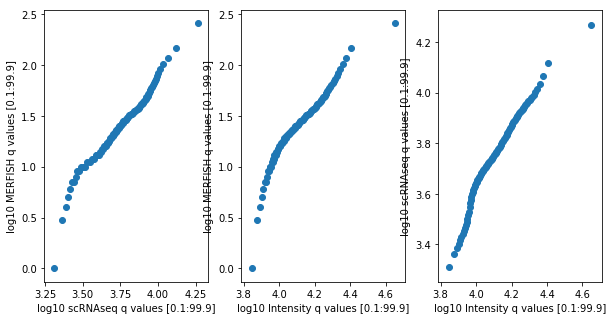

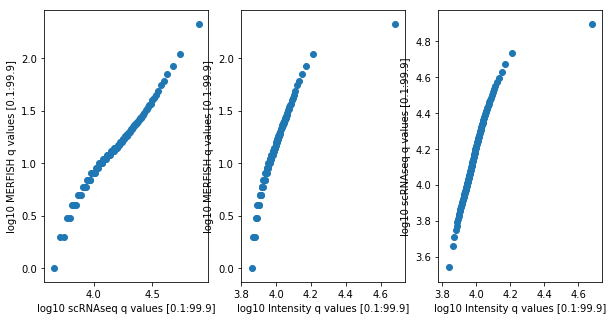

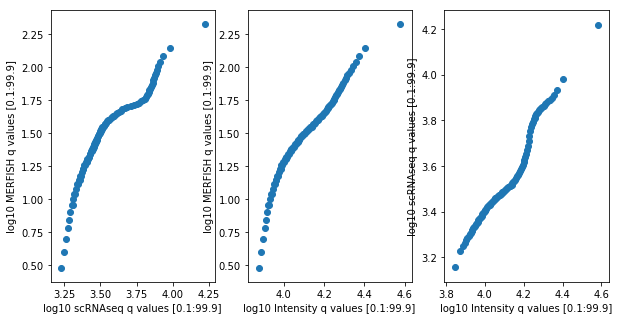

...

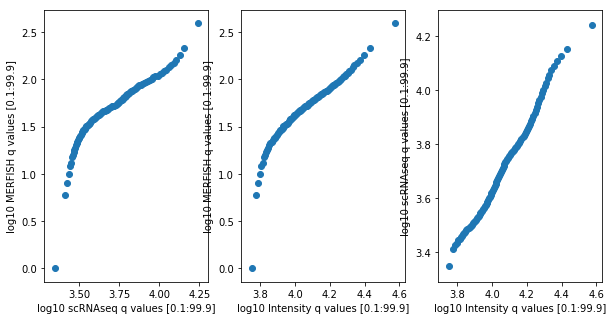

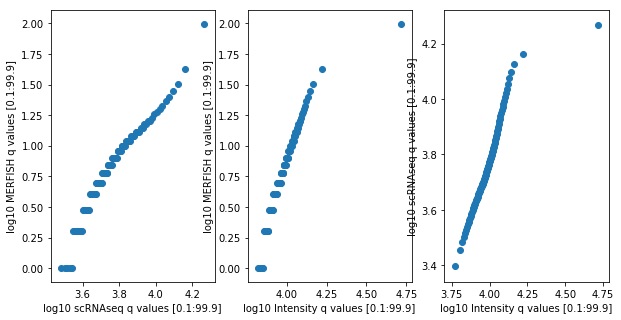

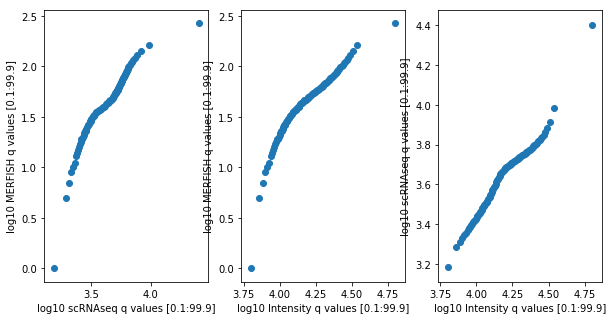

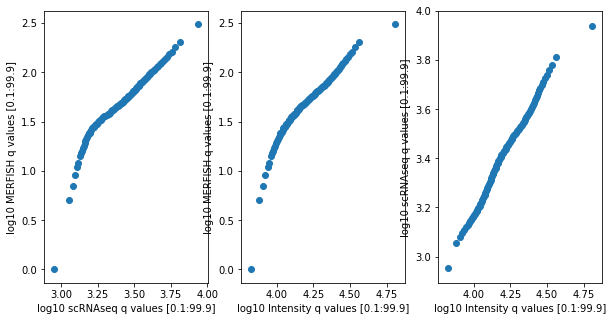

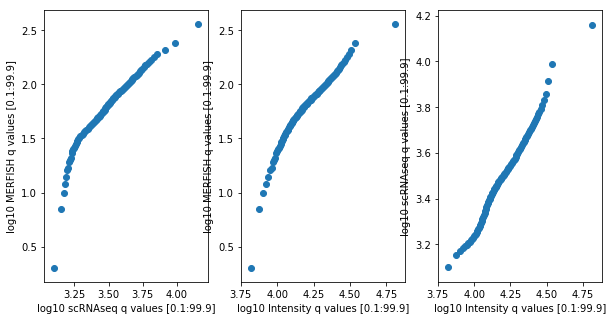

In [150]:
#QQplot CSI SC and MERFISH All Combinations
%matplotlib inline
qvalues = np.linspace(0.1,99.9,100)
for i in compressed_df.columns:
    scqvalues = []
    merqvalues = []
    iqvalues = []
    scvalues = np.array(scRNAseq_compressed[i]*(10**6))
    mervalues = np.array(MERFISH_compressed[i])
    ivalues = np.array(compressed_df[i])
    for q in qvalues:
        scqvalues.append(np.percentile(scvalues,q))
        merqvalues.append(np.percentile(mervalues,q))
        iqvalues.append(np.percentile(ivalues,q))
    plt.figure(figsize=[10,5])
    plt.title(i)
    plt.subplot(1,3,1)
    plt.scatter(np.log10(scqvalues),np.log10(merqvalues))
    plt.xlabel('log10 scRNAseq q values [0.1:99.9]')
    plt.ylabel('log10 MERFISH q values [0.1:99.9]')
    plt.subplot(1,3,2)
    plt.scatter(np.log10(iqvalues),np.log10(merqvalues))
    plt.xlabel('log10 Intensity q values [0.1:99.9]')
    plt.ylabel('log10 MERFISH q values [0.1:99.9]')
    plt.subplot(1,3,3)
    plt.scatter(np.log10(iqvalues),np.log10(scqvalues))
    plt.xlabel('log10 Intensity q values [0.1:99.9]')
    plt.ylabel('log10 scRNAseq q values [0.1:99.9]')
    plt.show()

In [153]:
# Need to normalize by cell size some how
import tqdm.notebook as tqdm
from multiprocessing import Pool
import sys
from functools import partial
sys.stdout.flush()
pfunc = partial(find_intensities,md=md,blur=10,color='DeepBlue',acq='nucstain')
Input = [cell_info_df[cell_info_df.pos==pos] for pos in cell_info_df.pos.unique()]
temp_dfs = []
with Pool(30) as p:
    for temp_df in tqdm.tqdm(p.imap(pfunc,Input,chunksize=1),total=len(Input)):
        temp_dfs.append(temp_df)
sys.stdout.flush()
intensity_df = pd.concat(temp_dfs)
intensity_df

opening img_Pos47_000000032_000000000_DeepBlue_000_032.tiff


,stage_x,stage_y,pos,pixel_x,pixel_y,z,nuclear intensity
0,6394.132364,1114.336273,Pos290,1707.636364,1773.727273,13.090909,91420.852667
397,6264.462000,1025.342727,Pos290,518.000000,957.272727,14.545455,63979.516682
493,6363.132154,1044.748538,Pos290,1423.230769,1135.307692,14.000000,87974.649513
785,6232.073429,1134.327929,Pos290,220.857143,1957.136959,13.428571,33548.550526
790,6369.320000,1029.019000,Pos290,1480.000000,991.000000,12.363636,68399.815083
948,6216.250294,949.917059,Pos290,75.690772,265.294118,12.352941,28781.815282
1203,6282.581154,1068.661462,Pos290,684.230769,1354.692308,14.000000,74167.018100
1360,6305.198933,1111.655533,Pos290,891.733333,1749.133333,13.600000,60382.577988
1456,6324.470692,1098.946692,Pos290,1068.538462,1632.538462,14.000000,64112.297340
1806,6346.916308,1024.474538,Pos290,1274.461538,949.307692,14.000000,59912.454715



spearman 0.6755
pearson 0.6294


/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in log10
  if sys.path[0] == '':


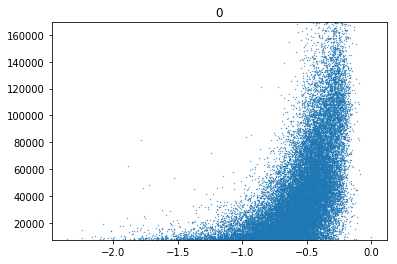


spearman 0.2605
pearson 0.1669


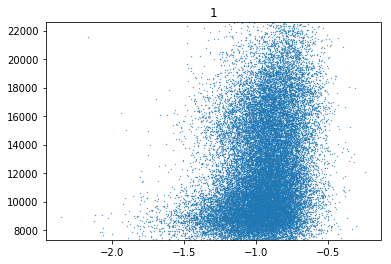


spearman 0.2588
pearson 0.1835


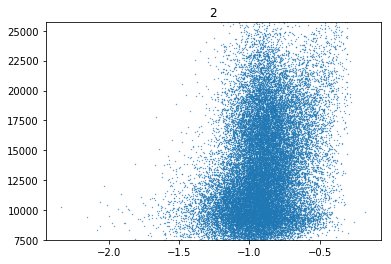


spearman -0.0562
pearson 0.1465


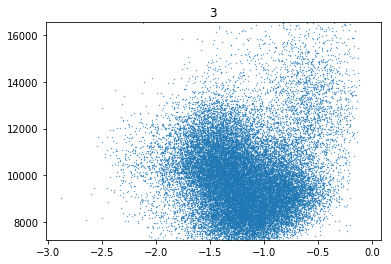


spearman 0.1848
pearson 0.1269


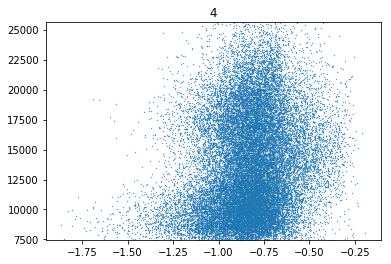


spearman 0.4219
pearson 0.3814


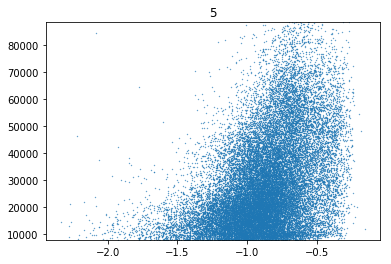


spearman -0.0098
pearson 0.062


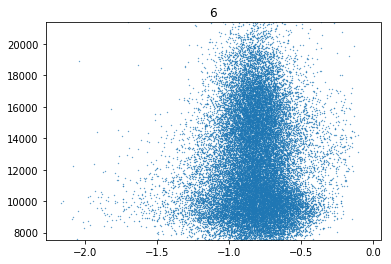


spearman 0.1704
pearson 0.0908


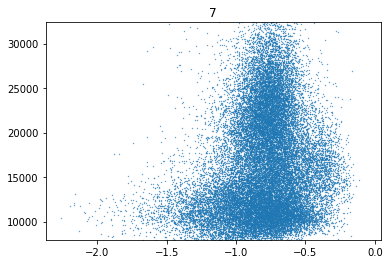


spearman -0.3363
pearson -0.1524


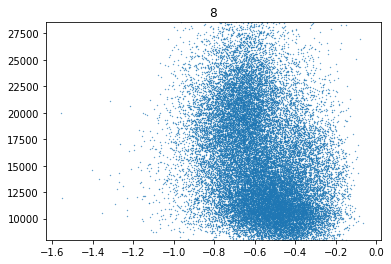


spearman 0.5858
pearson 0.5221


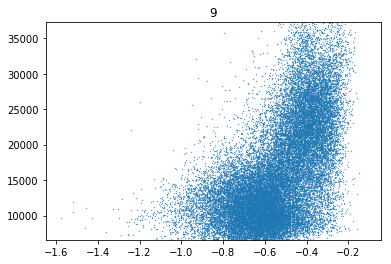


spearman 0.1483
pearson 0.1604


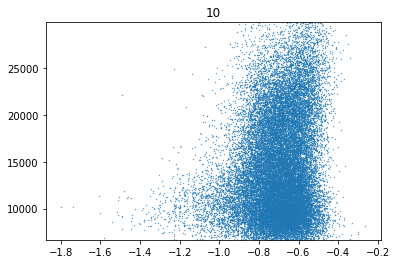


spearman -0.1705
pearson -0.1412


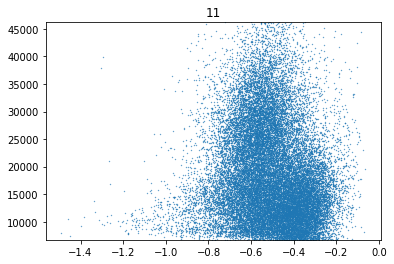


spearman 0.3986
pearson 0.3224


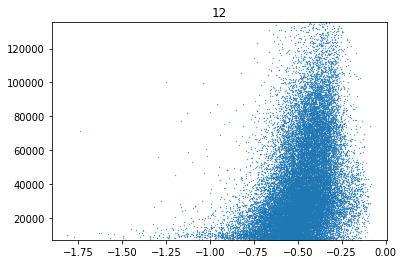


spearman -0.2499
pearson -0.1853


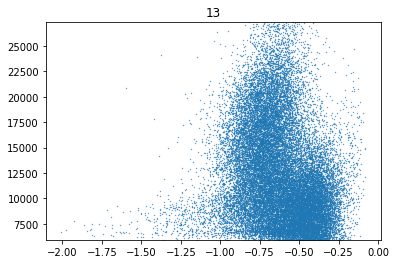


spearman 0.1685
pearson 0.3008


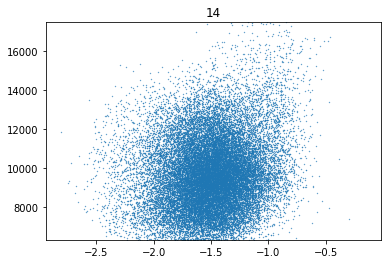


spearman 0.4098
pearson 0.3395


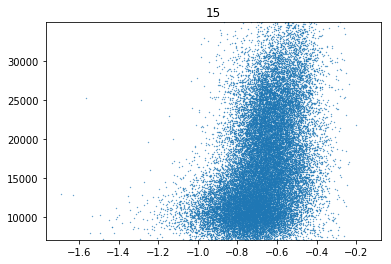


spearman -0.0454
pearson -0.0209


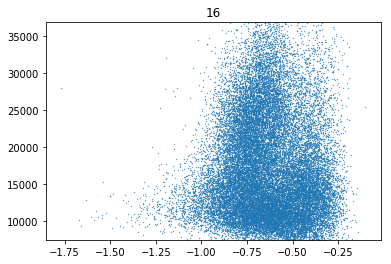


spearman 0.0312
pearson 0.0468


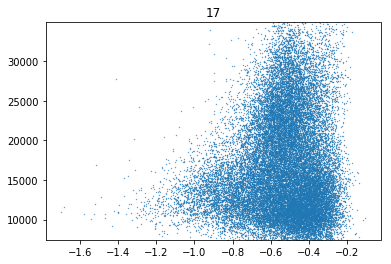

In [234]:
compressed_df = compressed_df.sort_index()
cell_counts_df = cell_counts_df.sort_index()
nuclear_intensity = intensity_df['nuclear intensity']
spot_sum = np.sum(cell_counts_df,axis=1)
for i in compressed_df.columns:
    intensities = compressed_df[i]#/nuclear_intensity
    temp_gene_col = list(binary_df[binary_df[i]==1].index)
    counts = np.sum(cell_counts_df[temp_gene_col],axis=1)/spot_sum
    print('')
    print('spearman',round(spearmanr(intensities,counts)[0],4))
    print('pearson',round(pearsonr(intensities,counts)[0],4))
    plt.scatter(np.log10(counts),intensities,s=0.1)
    plt.ylim([np.percentile(intensities,1),np.percentile(intensities,99)])
    plt.title(i)
    plt.show()

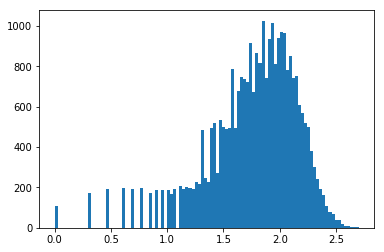

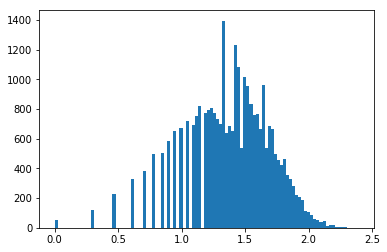

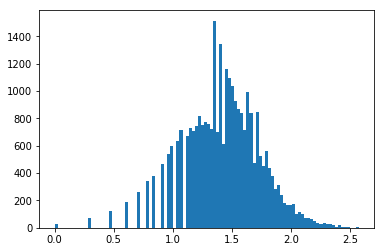

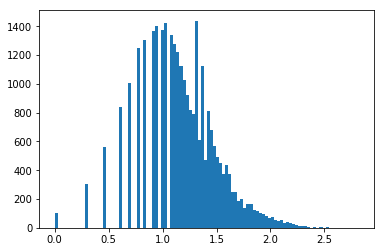

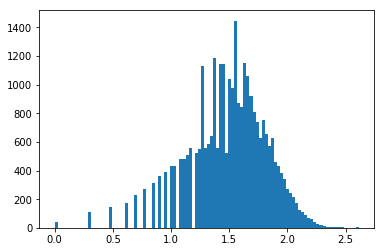

...

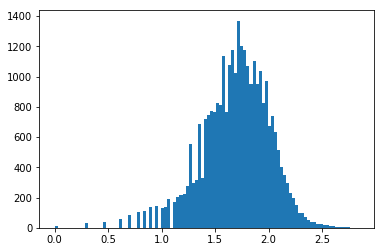

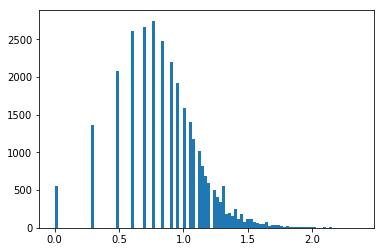

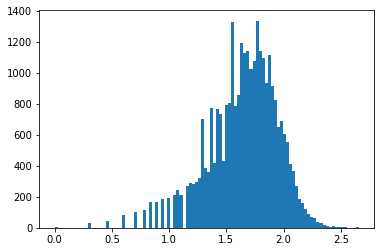

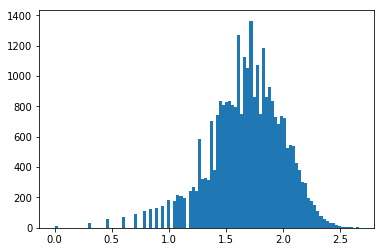

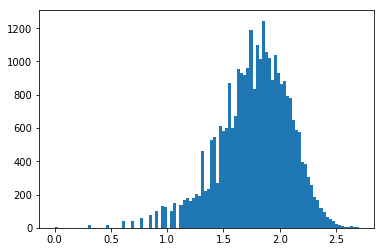

In [158]:
for i in compressed_df.columns:
    temp_gene_col = list(binary_df[binary_df[i]==1].index)
    ss = np.sum(cell_counts_df[temp_gene_col],axis=1)
    plt.hist(np.log10(ss+1),bins=100)
    plt.show()

In [160]:
matrix_df

,S1Hip_CCTTGCCACACT_ODC,S1Hip_TTCTATTCGTAG_ODC,S1Hip_TTGGGCCCACCG_ODC,S1Hip_ATGTACGCCGTG_ODC,S1Hip_CCAGAATAATTT_ODC,S1Hip_CCGCTCAAGTCC_ODC,S1Hip_GGAGGATTGGGT_ODC,S1Hip_AGTCACTGTTTA_ODC,S1Hip_TAAAACCTATCG_ODC,S1Hip_CCGTCCCGAGTT_ODC,...,TBI5Hip_TCCTGAGACGCT_EPEN,TBI5Hip_TTGCGCAAAACG_EPEN,TBI5Hip_ACGCCGAGTTGC_EPEN,TBI5Hip_CAGCATATGGCG_EPEN,TBI5Hip_GACATCATTCAT_EPEN,TBI5Hip_GGTATTGACACC_EPEN,TBI5Hip_TCCCACGCCAAC_EPEN,TBI5Hip_TTCCTGTAGACC_EPEN,TBI5Hip_ATTTAATTGAGC_EPEN,TBI5Hip_ATCCCTCGCAGC_EPEN
Reps1,4.432740e-05,3.627222e-05,3.204408e-05,4.988413e-05,4.400787e-05,6.379264e-05,4.613181e-05,5.982694e-05,3.018664e-05,4.897482e-05,...,2.705930e-05,7.052045e-05,4.239633e-05,6.270975e-05,7.923026e-05,3.409079e-05,5.083093e-05,4.029397e-05,4.255586e-05,2.297022e-05
Soga3,1.233983e-04,1.097830e-04,1.363549e-04,1.483357e-04,1.529769e-04,1.620846e-04,1.406424e-04,1.406503e-04,1.322850e-04,1.256736e-04,...,1.809963e-04,1.747574e-04,1.031361e-04,9.559583e-05,2.390540e-04,2.036348e-04,1.265044e-04,1.533321e-04,2.038386e-04,1.496775e-04
Rps15,6.180854e-04,5.289496e-04,5.716269e-04,4.918539e-04,5.250957e-04,6.916280e-04,5.511217e-04,4.586396e-04,4.771086e-04,4.842014e-04,...,2.142212e-04,1.825181e-04,3.559615e-04,2.827444e-04,9.291016e-05,1.865286e-04,2.646769e-04,3.318252e-04,2.181835e-04,4.299768e-04
Anks1b,4.593085e-04,5.221244e-04,6.097440e-04,5.430284e-04,5.316752e-04,5.219853e-04,5.633551e-04,4.753680e-04,5.485377e-04,5.268399e-04,...,8.583582e-05,2.406557e-04,1.182300e-04,1.056718e-04,8.480879e-05,1.177277e-04,1.084546e-04,1.252218e-04,9.968544e-05,1.248592e-04
Eea1,1.125073e-04,8.092835e-05,8.913188e-05,1.157198e-04,1.007362e-04,1.027714e-04,1.050855e-04,1.140152e-04,1.156729e-04,1.021141e-04,...,1.442493e-04,2.663250e-04,4.106371e-04,4.036101e-04,3.512182e-04,1.198819e-04,2.470003e-04,2.525159e-04,2.379561e-04,1.814376e-04
Rpl41,3.837326e-04,3.508408e-04,3.238221e-04,2.665462e-04,3.087560e-04,3.577402e-04,3.572902e-04,2.489660e-04,2.770683e-04,2.898120e-04,...,6.525186e-04,3.931725e-04,7.470084e-04,5.127084e-04,1.227115e-04,4.156613e-04,5.888047e-04,7.275656e-04,4.325367e-04,1.087831e-03
Ccdc85a,6.986219e-06,3.838045e-06,4.355288e-06,5.102248e-06,6.258316e-06,1.465645e-05,5.594862e-06,6.346606e-06,7.218621e-06,4.191392e-06,...,2.416907e-05,1.105746e-05,1.278783e-05,1.196377e-05,4.033251e-05,3.051860e-05,1.608567e-05,1.536107e-05,2.055802e-05,2.061328e-05
Cyfip2,3.740301e-05,3.194681e-05,2.794672e-05,2.782619e-05,4.225003e-05,5.741055e-05,3.544652e-05,4.252004e-05,3.484981e-05,3.788377e-05,...,5.960949e-05,5.614039e-05,2.385716e-05,2.759029e-05,1.068424e-04,5.646787e-05,3.577982e-05,3.459449e-05,4.799766e-05,4.219501e-05
Gria1,4.513687e-05,2.631211e-05,3.262442e-05,5.032895e-05,6.187367e-05,1.137878e-04,4.202487e-05,8.663401e-05,6.060128e-05,5.714726e-05,...,4.427285e-04,3.838684e-04,1.789489e-04,1.820489e-04,7.321700e-04,5.761309e-04,1.971484e-04,1.848873e-04,3.462010e-04,1.648241e-04
Dnah2,4.954114e-06,3.604976e-06,6.110165e-06,6.299065e-06,5.885966e-06,7.871920e-06,5.700338e-06,8.115047e-06,6.395014e-06,4.430359e-06,...,8.590142e-05,1.481628e-04,2.041448e-04,2.669000e-04,1.868974e-04,5.150689e-05,1.975760e-04,1.276727e-04,1.200390e-04,6.810624e-05


/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  This is separate from the ipykernel package so we can avoid doing imports until


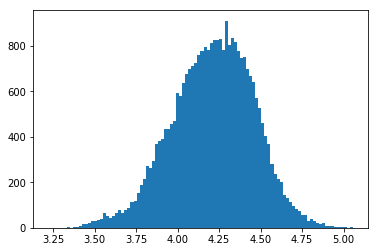

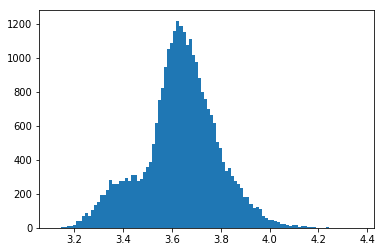

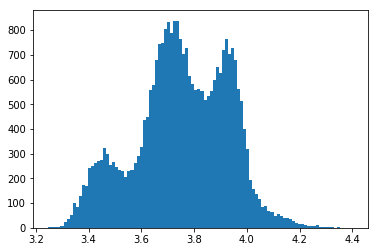

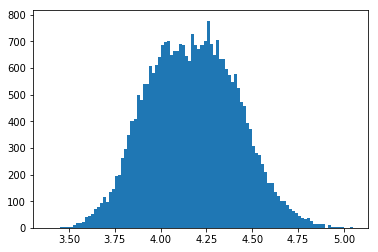

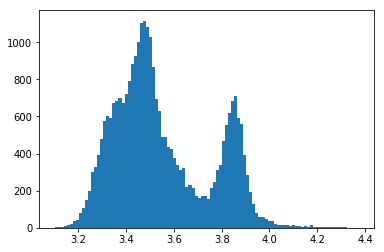

...

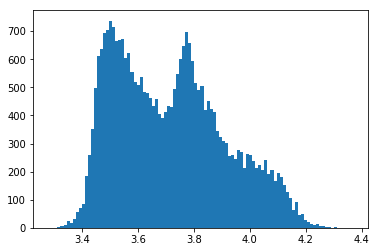

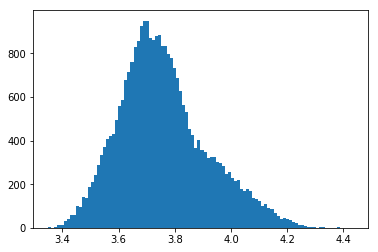

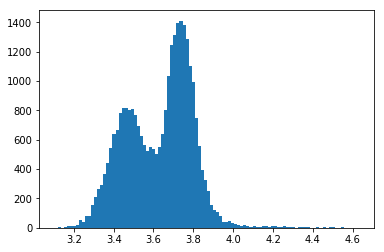

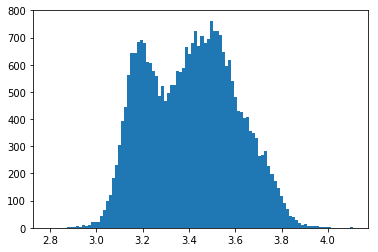

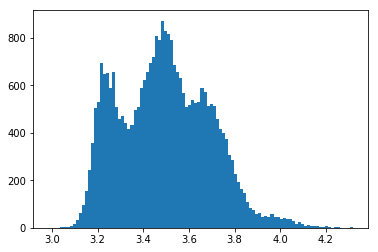

In [162]:
for i in compressed_df.columns:
    temp_gene_col = list(binary_df[binary_df[i]==1].index)
    ss = np.sum(matrix_df.loc[temp_gene_col],axis=0)*10**6
    plt.hist(np.log10(ss+1),bins=100)
    plt.show()

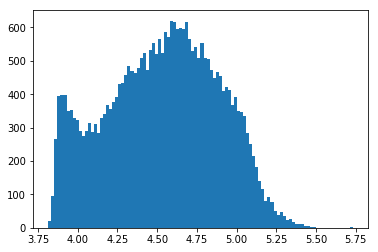

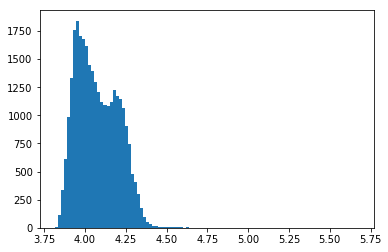

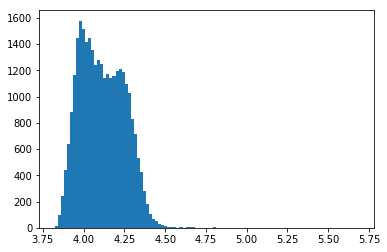

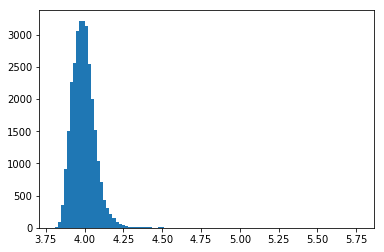

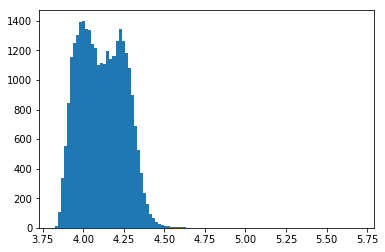

...

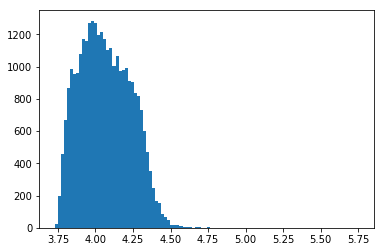

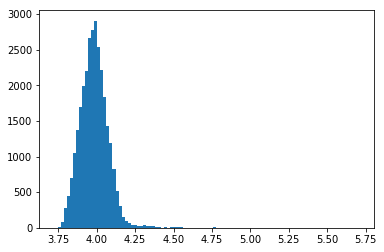

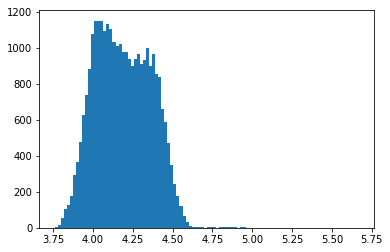

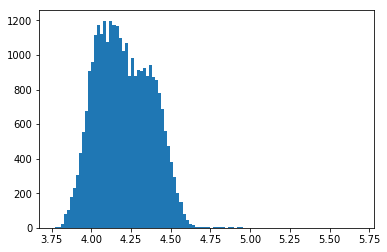

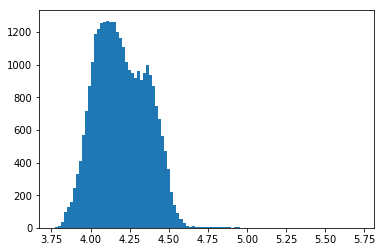

In [164]:
for i in compressed_df.columns:
    ss = compressed_df[i]
    plt.hist(np.log10(ss+1),bins=100)
    plt.show()

In [ ]:

for i in compressed_df.columns:
    temp_gene_col = list(binary_df[binary_df[i]==1].index)
    ss = np.sum(matrix_df.loc[temp_gene_col],axis=0)*10**6
    plt.hist(np.log10(ss+1),bins=100)
    plt.show()

In [ ]:
temp_gene_col = list(binary_df[binary_df[i]==1].index)

opening img_Pos1_000000032_000000000_FarRed_000_032.tif

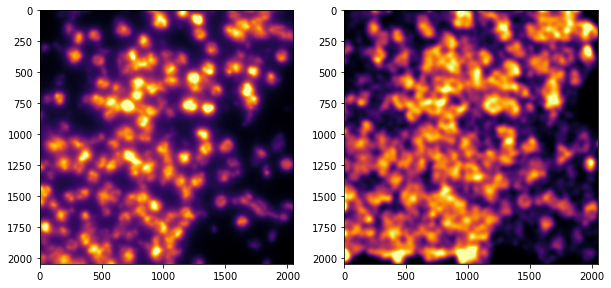

In [229]:
pos = 'Pos1'
i=0
pos_spots = spots[spots.pos==pos]
pos_cells = cell_info_df[cell_info_df.pos==pos]
r,hybe,color = bitmap[i]
temp_gene_col = list(binary_df[binary_df[i]==1].index)
acq = [i for i in md.acqnames if hybe in i]
stk = md.stkread(Position=pos,Channel=color,acq=acq).astype('float64')
img = np.sum(stk,axis=2)
blurred_img = filters.gaussian(img, 10)
hist_2d = (10**6) * np.histogram2d(pos_spots.pixel_x,pos_spots.pixel_y,bins=2048,range=[[0,2048],[0,2048]])[0].T
blurred_hist_2d = filters.gaussian(hist_2d, 20)
show(blurred_img,blurred_hist_2d)

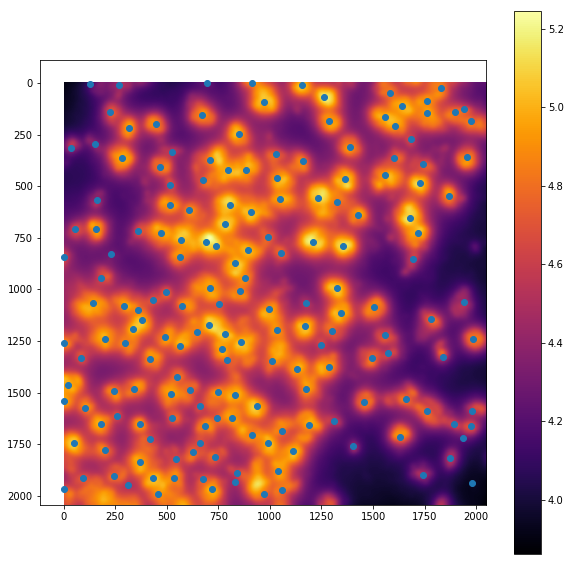

In [198]:
plt.figure(figsize=[10,10])
plt.imshow(np.log10(blurred_img),cmap='inferno')
plt.colorbar()
plt.scatter(pos_cells.pixel_x,pos_cells.pixel_y)
plt.show()

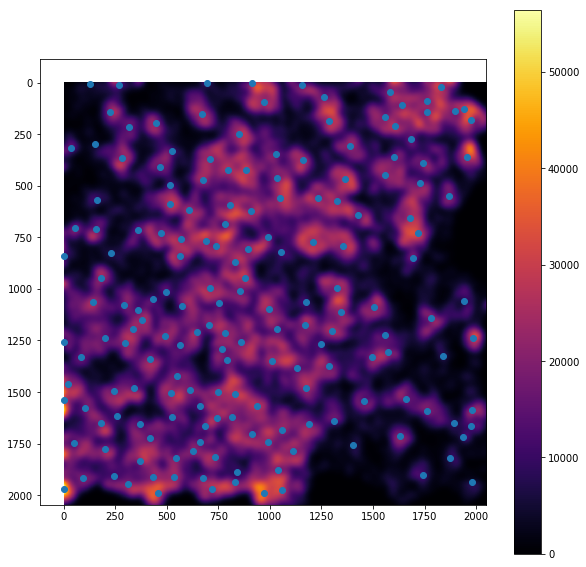

In [210]:
plt.figure(figsize=[10,10])
plt.imshow(blurred_hist_2d,cmap='inferno')
plt.colorbar()
plt.scatter(pos_cells.pixel_x,pos_cells.pixel_y)
plt.show()

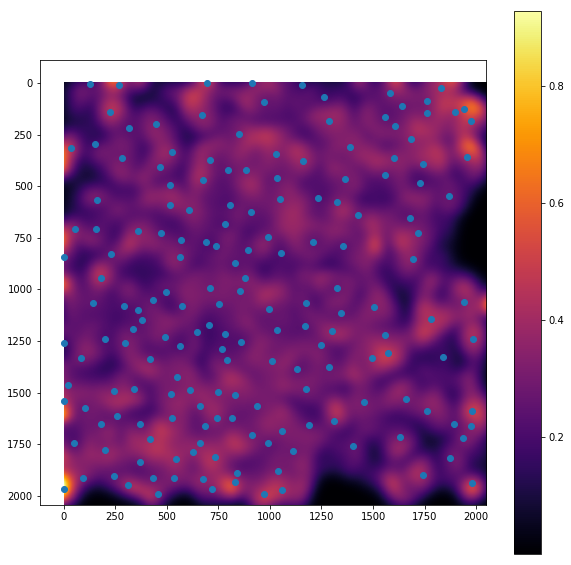

In [230]:
plt.figure(figsize=[10,10])
blurred_img = filters.gaussian(img, 40)
blurred_hist_2d = filters.gaussian(hist_2d, 40)
sub = blurred_hist_2d/blurred_img
plt.imshow(sub,cmap='inferno')
plt.colorbar()
plt.scatter(pos_cells.pixel_x,pos_cells.pixel_y)
plt.show()

In [697]:
temp = pos_cells[(pos_cells.z>0+border_z)&
                 (pos_cells.z<np.max(pos_cells.z)-border)&
                 (pos_cells.pixel_x>0+border)&
                 (pos_cells.pixel_x<2048-border)&
                 (pos_cells.pixel_y>0+border)&
                 (pos_cells.pixel_y<2048-border)]
temp

,stage_x,stage_y,pos,pixel_x,pixel_y,z


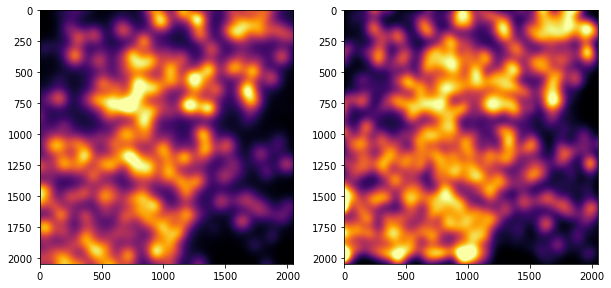

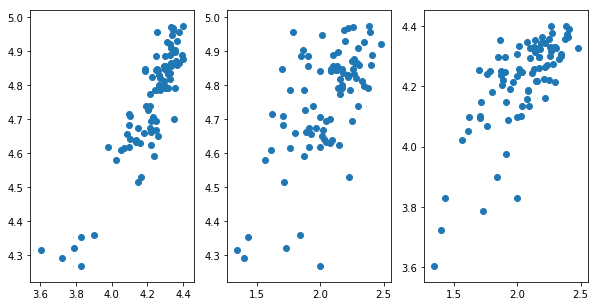

SpearmanrResult(correlation=0.8453323269965564, pvalue=1.3784774681672447e-24)
SpearmanrResult(correlation=0.5667380586310704, pvalue=1.283507852786463e-08)
SpearmanrResult(correlation=0.7008557503045183, pvalue=5.791825909831257e-14)


In [704]:
blur = 40
blurred_img = filters.gaussian(img, blur)
blurred_hist_2d = filters.gaussian(hist_2d, blur)
hist_intensities = []
img_intensities = []
border_z = 10
border = 100
temp = pos_cells[(pos_cells.z>0+border_z)&
                 (pos_cells.z<np.max(pos_cells.z)-border_z)&
                 (pos_cells.pixel_x>0+border)&
                 (pos_cells.pixel_x<2048-border)&
                 (pos_cells.pixel_y>0+border)&
                 (pos_cells.pixel_y<2048-border)]
counts = np.sum(cell_counts_df[temp_gene_col].loc[temp.index],axis=1)

for cell in temp.index:
    x = int(pos_cells.pixel_x.loc[cell])
    y = int(pos_cells.pixel_y.loc[cell])
    hist_intensities.append(blurred_hist_2d[y,x])
    img_intensities.append(blurred_img[y,x])
show(blurred_img,blurred_hist_2d)
plt.figure(figsize=[10,5])
plt.subplot(1,3,1)
plt.scatter(np.log10(hist_intensities),np.log10(img_intensities))
plt.subplot(1,3,2)
plt.scatter(np.log10(counts),np.log10(img_intensities))
plt.subplot(1,3,3)
plt.scatter(np.log10(counts),np.log10(hist_intensities))
plt.show()
print(spearmanr(hist_intensities,img_intensities))
print(spearmanr(counts,img_intensities))
print(spearmanr(counts,hist_intensities))

In [248]:
# scRNAseq compressed
import pickle
import pandas as pd
matrix = pickle.load(open('/bigstore/binfo/mouse/Hippocampus/TBI.SHAM.countdata.with.celltypes.normalized.pkl','rb'))
latent = pd.read_csv('/bigstore/binfo/mouse/Hippocampus/TBI.SHAM.countdata.with.celltypes.latent.csv.gz',index_col=0)
genes = pd.read_csv('/bigstore/binfo/mouse/Hippocampus/TBI.SHAM.countdata.with.celltypes.genes.csv',index_col=0)
info_df = pd.read_csv('/bigstore/binfo/mouse/Hippocampus/TBI.SHAM.countdata.with.celltypes.info_df.csv',index_col=0)
matrix_df = pd.DataFrame(matrix.T,index=genes.index,columns=info_df.index)
compressed = pd.DataFrame(index=matrix_df.columns)
probed_expression_matrix = matrix_df.loc[list(codewords.name)]
temp_matrix = np.array(probed_expression_matrix)
for i in range(18):
    compressed[i] = np.nansum(np.multiply(temp_matrix,binary[:,i][...,None]),axis=0)
scRNAseq_compressed = compressed

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:10: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  # Remove the CWD from sys.path while we load stuff.


In [296]:
# interpolate to scRNAseq
from scipy.interpolate import interp1d
percentile = np.linspace(0,100,1000)
scRNAseq_compressed_interpolated = compressed_df.copy()
for i in range(18):
    scRNAseq_percentile = []
    intensity_percentile = []
    for p in percentile:
        scRNAseq_percentile.append(np.percentile(scRNAseq_compressed[i],p))
        intensity_percentile.append(np.percentile(compressed_df[i],p))
    f = interp1d(intensity_percentile,scRNAseq_percentile,kind='linear')
    scRNAseq_compressed_interpolated[i] = compressed_df[i].apply(f)
    

In [297]:
scRNAseq_compressed_interpolated

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.021617,0.004476,0.005778,0.012494,0.003298,0.013918,0.003506,0.004295,0.004881,0.004515,0.002365,0.006084,0.016202,0.006204,0.005536,0.005235,0.003231,0.003720
1,0.020071,0.004437,0.005390,0.010276,0.003061,0.013657,0.003255,0.004176,0.004227,0.003649,0.001961,0.004983,0.012704,0.004813,0.004346,0.004467,0.002572,0.002908
2,0.035294,0.007198,0.009309,0.023529,0.008125,0.032851,0.005837,0.010900,0.006251,0.006496,0.004044,0.009316,0.029840,0.010344,0.007560,0.006581,0.005168,0.005250
3,0.008624,0.002105,0.002537,0.005812,0.001869,0.006229,0.001709,0.001993,0.002474,0.002167,0.001283,0.003541,0.006528,0.003049,0.003398,0.002162,0.001323,0.001568
4,0.024280,0.004685,0.005867,0.012122,0.003242,0.013974,0.003449,0.004559,0.004668,0.004246,0.002299,0.005756,0.015779,0.006894,0.004816,0.005086,0.003167,0.003457
5,0.004061,0.001602,0.002094,0.003577,0.001455,0.003222,0.001466,0.001618,0.002018,0.001534,0.001053,0.002477,0.003607,0.002226,0.002688,0.001682,0.000920,0.001297
6,0.072087,0.007878,0.010079,0.028456,0.008452,0.043385,0.006638,0.012183,0.008529,0.007953,0.005323,0.012275,0.054939,0.016392,0.009928,0.008013,0.006303,0.007469
7,0.023430,0.003967,0.004960,0.010086,0.002856,0.013756,0.002654,0.003485,0.003868,0.003562,0.001827,0.005318,0.016457,0.005941,0.004383,0.003820,0.002395,0.002883
8,0.033721,0.005398,0.008174,0.019901,0.005908,0.021864,0.004793,0.007886,0.006215,0.006288,0.004081,0.008077,0.026227,0.011967,0.007592,0.006466,0.004321,0.006812
9,0.012951,0.002789,0.003290,0.007551,0.002352,0.008766,0.002006,0.002739,0.002800,0.002735,0.001399,0.004057,0.008426,0.003376,0.003663,0.002549,0.001430,0.001743


In [298]:
scRNAseq_compressed

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
S1Hip_CCTTGCCACACT_ODC,0.012482,0.005789,0.009033,0.008862,0.006096,0.010212,0.004171,0.007589,0.003029,0.002964,0.001329,0.006154,0.007473,0.003674,0.006936,0.004815,0.001944,0.001434
S1Hip_TTCTATTCGTAG_ODC,0.017620,0.004561,0.008725,0.013138,0.006982,0.015158,0.005140,0.009812,0.002647,0.003640,0.001283,0.005138,0.011159,0.003391,0.005838,0.005672,0.002619,0.001436
S1Hip_TTGGGCCCACCG_ODC,0.013316,0.004405,0.007607,0.009660,0.006214,0.010512,0.004143,0.008007,0.003045,0.003445,0.001564,0.004694,0.008270,0.003830,0.005314,0.005565,0.002283,0.001791
S1Hip_ATGTACGCCGTG_ODC,0.014806,0.003807,0.007677,0.010183,0.006778,0.012458,0.004795,0.009166,0.002839,0.003124,0.001340,0.004203,0.008626,0.003360,0.004916,0.005673,0.002613,0.001582
S1Hip_CCAGAATAATTT_ODC,0.012594,0.004159,0.007601,0.009427,0.005988,0.010730,0.004478,0.007683,0.002926,0.003536,0.001526,0.004561,0.007889,0.003493,0.005371,0.005058,0.002261,0.001693
S1Hip_CCGCTCAAGTCC_ODC,0.011272,0.005772,0.008288,0.008870,0.004968,0.010113,0.004537,0.006952,0.003690,0.003336,0.001528,0.006187,0.007913,0.004395,0.007287,0.004095,0.002355,0.001833
S1Hip_GGAGGATTGGGT_ODC,0.012980,0.004436,0.008085,0.009151,0.006261,0.010636,0.004321,0.008209,0.002768,0.003215,0.001413,0.004783,0.007587,0.003437,0.005476,0.005194,0.002205,0.001557
S1Hip_AGTCACTGTTTA_ODC,0.016052,0.005112,0.008339,0.013125,0.005919,0.013940,0.004296,0.007290,0.003163,0.003565,0.001668,0.005690,0.011534,0.003661,0.006562,0.004871,0.002163,0.001756
S1Hip_TAAAACCTATCG_ODC,0.014487,0.004717,0.008235,0.010807,0.006450,0.011425,0.004036,0.007879,0.002952,0.003482,0.001615,0.005110,0.009110,0.003716,0.005778,0.005613,0.002103,0.001843
S1Hip_CCGTCCCGAGTT_ODC,0.015566,0.004953,0.008528,0.011615,0.006481,0.013112,0.004681,0.008621,0.002762,0.003357,0.001312,0.005322,0.009917,0.003338,0.006161,0.005364,0.002237,0.001407


In [305]:
# knn in scRNAseq
import random
from sklearn.metrics.pairwise import euclidean_distances
ref = scRNAseq_compressed
mes = scRNAseq_compressed_interpolated
reference = np.array(scRNAseq_compressed.copy())
measured = np.array(scRNAseq_compressed_interpolated.copy())
cells = np.array(scRNAseq_compressed_interpolated.index)
ref_cells = list(ref.index)
k = 10
# dist = euclidean_distances(reference, measured)
# rank = dist.argpartition(k+1,axis=0)[:k+1,:]
metrics = []
correlations = []
cells_df = pd.DataFrame([i.split('_')[-1] for i in ref.index],
                        index=ref.index,columns=['cell_type'])
cell_types = list(cells_df.cell_type.unique())
cell_types.sort()
cell_types_idx = pd.DataFrame(list(range(len(cell_types))),index=cell_types)
cell_type_matrix = np.zeros_like(rank)
for x in range(rank.shape[0]):
    for y in range(rank.shape[1]):
        cell_type_matrix[x,y] = cell_types_idx.loc[ref_cells[rank[x,y]].split('_')[-1]].iloc[0]
from scipy.stats import mode
# real = cell_type_matrix[0,:]
imputed = mode(cell_type_matrix[1:,:],axis=0).mode.T[:,0]
temp = pd.DataFrame(cell_types_idx.index,index=cell_types_idx[0])
imputed_cell_types = pd.DataFrame([temp.loc[i].iloc[0] for i in imputed],
                                  index=cells,columns=['imputed'])

# info_df['imputed_cell_type'] = imputed_cell_types
# cell_type_dict = {}
# for idx in cell_types_idx[0]:
#     cell_type_dict[idx] = []
# for i,r in enumerate(real):
#     cell_type_dict[r].append(imputed[i])
# confusion_matrix = np.zeros((len(cell_types),len(cell_types)))
# for key,imlist in cell_type_dict.items():
#     for cell_type,n in Counter(imlist).items():
#         confusion_matrix[key,cell_type]= n/len(imlist)

In [307]:
temp_df

,stage_x,stage_y,pos,pixel_x,pixel_y,z
2,5346.885846,3366.115231,Pos214,1778.769231,1147.846154,14.000000
22,4431.352500,1966.804417,Pos136,1122.500000,1851.416667,13.333333
42,4744.858542,3584.766542,Pos177,127.142584,1218.041667,13.083333
74,5221.055636,3428.222364,Pos214,624.363636,1717.636364,18.909091
88,3278.449533,2508.947467,Pos56,215.133333,1017.866667,17.866667
89,4297.790588,2172.129471,Pos121,1832.941176,1799.352941,16.117647
103,5604.009571,1209.374429,Pos248,266.142857,709.857143,12.142857
104,5215.776733,3383.128733,Pos214,575.933333,1303.933333,13.066667
155,6155.565933,901.701933,Pos279,1454.733333,1758.733333,12.800000
157,6231.644615,1478.495385,Pos292,216.923077,1243.076923,14.000000


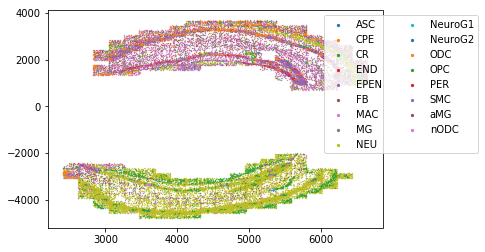

In [312]:
for ct in cell_types:
    temp = list(imputed_cell_types[imputed_cell_types['imputed']==ct].index)
    temp_df = cell_info_df.loc[temp]
    plt.scatter(temp_df.stage_x,temp_df.stage_y,s=0.1,label=ct)
lgnd = plt.legend(borbbox_to_anchor=(0.8, 0.5, 0.5, 0.5),ncol=2)
for i in range(len(lgnd.legendHandles)):
    lgnd.legendHandles[i]._sizes = [5]
plt.show()

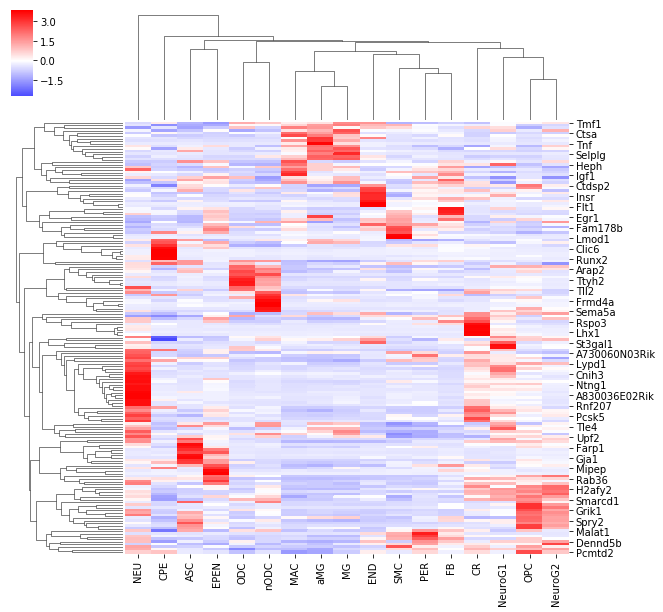

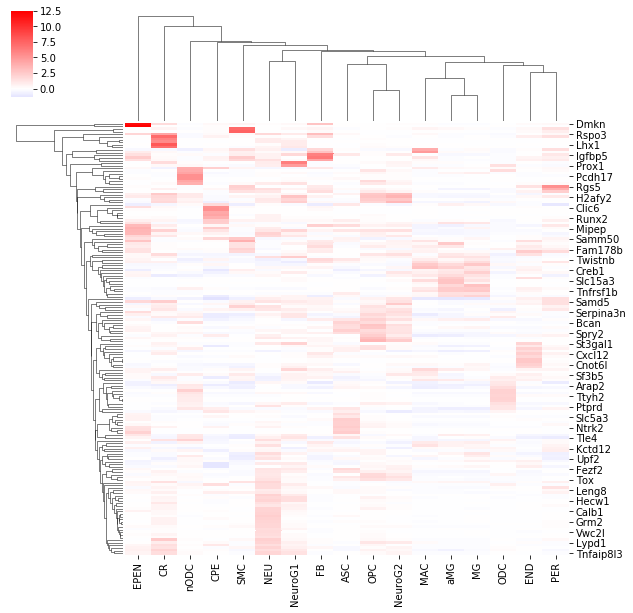

In [515]:
# Cell types MERFISH
cell_type_profiles = pd.DataFrame(index=merfished_genes)
cell_type_profiles_zscore = pd.DataFrame(index=merfished_genes)
merfished_genes = [i for i in cell_counts_df.columns if i in matrix_df.index]
median = np.median(matrix_df.loc[merfished_genes],axis=1)
std = np.std(matrix_df.loc[merfished_genes],axis=1)
cell_types = info_df.cell_type.unique()
for ct in cell_types:
    ct_df = matrix_df[info_df[info_df.cell_type==ct].index].loc[merfished_genes]
    cell_type_profiles_zscore[ct] = (np.average(ct_df,axis=1)-median)/std
    cell_type_profiles[ct] = np.average(ct_df,axis=1)
sns.clustermap(cell_type_profiles,z_score=0,cmap='bwr',center=0)
plt.show()
sns.clustermap(cell_type_profiles_zscore,cmap='bwr',center=0)
plt.show()

In [594]:
post_adata6 = pd.read_csv('/bigstore/GeneralStorage/Zach/CSI/post_adata6.csv.gz',index_col=0)
post_adata6

,louvain_r0.5,louvain_r1,louvain_r1.5,louvain_r2.5,louvain_r3,louvain_r4,cell
0,3,1,11,13,12,12,0
1,0,0,14,16,16,16,1
2,5,7,10,8,6,5,2
3,0,0,3,0,0,6,3
4,3,1,5,2,1,0,4
5,0,0,2,3,2,3,5
6,3,1,5,2,1,0,6
7,0,0,7,12,15,4,7
8,3,1,11,13,12,12,8
9,8,12,15,17,18,19,9


In [717]:
genes = [i for i in cell_counts_df.columns if i in cell_type_profiles_zscore.index]
cluster_profiles = pd.DataFrame(index=genes)
size_norm = np.divide(cell_counts_df[genes],np.sum(cell_counts_df[genes],axis=1)[:,None])
mean = np.mean(size_norm[genes],axis=0)
std = np.std(size_norm[genes],axis=0)
for cluster in post_adata6['louvain_r0.5'].unique():
    temp = list(post_adata6[post_adata6['louvain_r0.5']==cluster].index)
    m = np.mean(size_norm[genes].loc[temp],axis=0)
    cluster_profiles[cluster] = (m-mean)/std

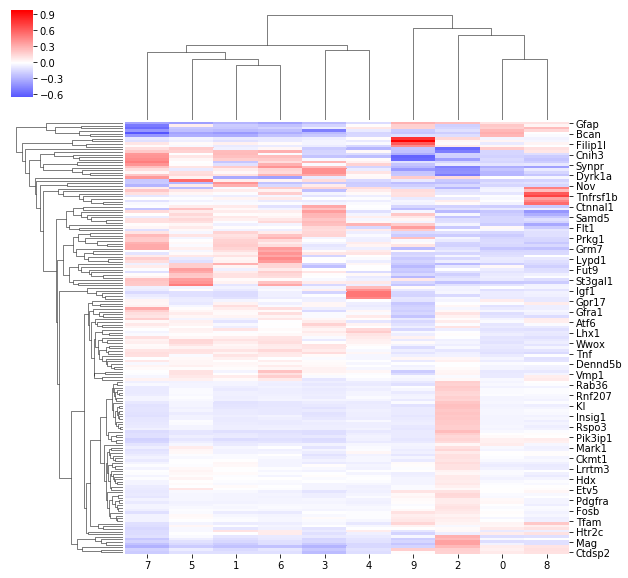

In [718]:
sns.clustermap(np.log10(cluster_profiles+1),cmap='bwr',center=0)
plt.show()

In [719]:
cluster_assignments = []
for cluster in cluster_profiles.columns:
    dist = np.sqrt(np.sum(np.subtract(cell_type_profiles_zscore,cluster_profiles[cluster][:,None])**2,axis=0))
    cluster_assignments.append(dist.sort_values(ascending=True).index[0])
cluster_assignment_df = pd.DataFrame(cluster_assignments,index=cluster_profiles.columns)
cluster_assignment_df

,0
3,ODC
0,ODC
5,ODC
8,MG
1,ODC
2,ODC
4,ODC
6,ODC
9,SMC
7,ODC


In [628]:
temp = cell_type_profiles_zscore.copy().T
cts = []
for gene in temp.columns:
    cts.append(temp.sort_values(gene,ascending=False).index[0])
gene2ct_df = pd.DataFrame(cts,temp.columns)
gene2ct_df

,0
A730060N03Rik,NEU
A830036E02Rik,NEU
Abcb1a,END
Adamts9,END
Aqp4,ASC
Arap2,ODC
Asb7,ODC
Atf6,FB
Bbs1,EPEN
Bcan,ASC


In [732]:
cluster_assignments = []
for cluster in cluster_profiles.columns:
    temp =  cluster_profiles.sort_values(cluster,ascending=False).index[0:2]
    c = []
    for gene in temp:
        c.append(gene2ct_df.loc[gene])
    cluster_assignments.append(str(mode(c).mode[0][0]))
cluster_assignments[-1] = 'NEU'
cluster_assignment_df = pd.DataFrame(cluster_assignments,index=cluster_profiles.columns)
Counter(cluster_assignments)

Counter({'NEU': 4, 'ASC': 2, 'MG': 1, 'FB': 1, 'ODC': 1, 'SMC': 1})

In [774]:
post_adata6['cell_type'] = [cluster_assignment_df[0].loc[i] for i in post_adata6['louvain_r0.5']]

In [775]:
cts = []
ccs = []
for ct,cc in Counter(post_adata6['cell_type']).items():
    cts.append(ct)
    ccs.append(cc)
ct_comp = pd.DataFrame(ccs,index=cts)
ct_comp['%'] = 100*ct_comp/np.sum(ct_comp[0])
ct_comp.sort_values(0,ascending=False)

,0,%
ASC,10494,35.391724
NEU,8165,27.537014
FB,5267,17.763313
ODC,5027,16.953897
MG,546,1.841422
SMC,152,0.512630


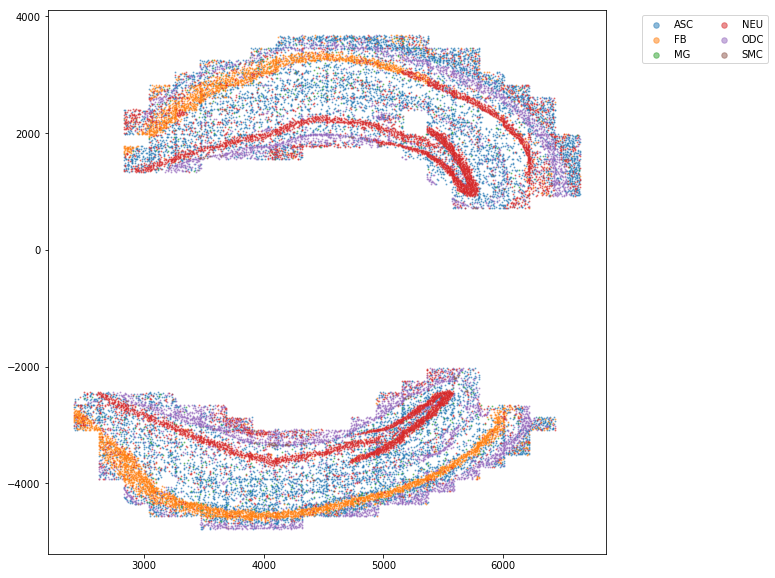

In [777]:
plt.figure(figsize=[10,10])
cell_types = post_adata6['cell_type'].unique()
cell_types.sort()
for ct in cell_types:
    temp_df = cell_info_df.loc[list(post_adata6[post_adata6['cell_type']==ct].index)]
    plt.scatter(temp_df.stage_x,temp_df.stage_y,s=1,alpha=0.5,label=ct)
lgnd = plt.legend(bbox_to_anchor=(0.8, 0.5, 0.5, 0.5),ncol=2)
for i in range(len(lgnd.legendHandles)):
    lgnd.legendHandles[i]._sizes = [30]
plt.show()

In [738]:
cts = []
ccs = []
for ct,cc in Counter(info_df.cell_type).items():
    cts.append(ct)
    ccs.append(cc)
ct_comp = pd.DataFrame(ccs,index=cts)
ct_comp['%'] = 100*ct_comp/np.sum(ct_comp[0])
ct_comp.sort_values(0,ascending=False)

,0,%
ODC,5808,20.018612
ASC,4599,15.851515
NEU,4270,14.717540
END,3914,13.490504
aMG,2641,9.102816
OPC,2018,6.955503
MG,1801,6.207562
CPE,910,3.136525
nODC,531,1.830214
MAC,513,1.768173


In [572]:
used_genes = []
duplicate = []
ct_gene_dict = {}
for ct in cell_type_profiles_zscore.columns:
    genes = list(cell_type_profiles_zscore[cell_type_profiles_zscore[ct]>2].index)
    for gene in genes:
        if gene in used_genes:
            duplicate.append(gene)
        else:
            used_genes.append(gene)
for ct in cell_type_profiles_zscore.columns:
    genes = list(cell_type_profiles_zscore[cell_type_profiles_zscore[ct]>2].index)
    ct_genes = []
    for gene in genes:
        if not gene in duplicate:
            ct_genes.append(gene)
    ct_gene_dict[ct] = ct_genes
    print(ct,ct_genes)

ODC ['Mapt', 'Mog', 'Opalin', 'Ttyh2']
ASC ['Aqp4', 'Bcan', 'Cxcl14', 'Farp1', 'Gja1', 'Ncan', 'Ntrk2']
NEU ['A730060N03Rik', 'A830036E02Rik', 'Calb1', 'Ckmt1', 'Cnih3', 'Grm2', 'Hecw1', 'Kcnc4', 'Lypd1', 'Ntng1', 'Pcsk5', 'Rnf207', 'Tnfaip8l3']
aMG ['Egr1', 'Pdgfb', 'Slc15a3', 'Tnf']
END ['Abcb1a', 'Cnot6l', 'Cxcl12', 'Flt1', 'Mfsd2a', 'Nes']
MG ['Mcph1', 'Selplg', 'Trappc8']
OPC ['Cspg5', 'Etv5', 'Lrrtm3', 'Pcmtd2', 'Serpine2']
CPE ['Clic6', 'Htr2c', 'Kl', 'Runx2', 'Th', 'Tmem117', 'Wwox']
PER ['Prkg1']
SMC ['Chrm2', 'Fam178b', 'Filip1l', 'Lmod1']
nODC ['Frmd4a', 'Gjc3', 'Gpr17', 'Pcdh17', 'Rassf10', 'Sema5a', 'Thra']
CR ['Lhx1', 'Ndnf', 'Plekha5', 'Pnoc', 'Reln', 'Samd5', 'Slc17a6']
NeuroG1 ['Dlx6os1', 'Heph', 'Plxna4', 'Prox1']
MAC ['Hgsnat']
FB ['Igfbp5', 'Nov']
NeuroG2 ['Smc6']
EPEN ['Cadps2', 'Fam216b']


In [747]:
ct_weights_sc = pd.DataFrame(index=cell_counts_df.index)
for ct,genes in ct_gene_dict.items():
    ct_weights_sc[ct] = np.sum(cell_counts_df[genes],axis=1)
normalized_ct_weights_sc = ct_weights_sc/np.sum(ct_weights_sc,axis=0)
normalized_ct_weights_sc = normalized_ct_weights_sc.T
normalized_ct_weights_sc

,0,1,2,3,4,5,6,7,8,9,...,29641,29642,29643,29644,29645,29646,29647,29648,29649,29650
ODC,0.000007,0.000022,0.000022,0.000000,0.000007,0.000015,0.000022,0.000015,0.000000,0.000030,...,0.000000,0.000022,0.000007,0.000000,0.000022,0.000000,0.000007,0.000090,0.000000,0.000007
ASC,0.000040,0.000037,0.000045,0.000052,0.000027,0.000031,0.000025,0.000069,0.000021,0.000048,...,0.000002,0.000060,0.000012,0.000014,0.000003,0.000004,0.000054,0.000000,0.000035,0.000031
NEU,0.000031,0.000013,0.000101,0.000000,0.000031,0.000000,0.000050,0.000013,0.000006,0.000000,...,0.000000,0.000038,0.000038,0.000113,0.000000,0.000006,0.000000,0.000013,0.000013,0.000013
aMG,0.000009,0.000009,0.000141,0.000000,0.000053,0.000018,0.000062,0.000018,0.000044,0.000018,...,0.000000,0.000009,0.000035,0.000026,0.000026,0.000000,0.000000,0.000000,0.000009,0.000000
END,0.000046,0.000023,0.000070,0.000000,0.000039,0.000008,0.000116,0.000116,0.000062,0.000046,...,0.000000,0.000008,0.000008,0.000015,0.000023,0.000000,0.000015,0.000000,0.000015,0.000008
MG,0.000040,0.000040,0.000277,0.000000,0.000000,0.000040,0.000000,0.000000,0.000000,0.000040,...,0.000000,0.000000,0.000040,0.000119,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
OPC,0.000062,0.000034,0.000048,0.000034,0.000041,0.000021,0.000034,0.000076,0.000069,0.000110,...,0.000000,0.000021,0.000000,0.000028,0.000014,0.000000,0.000007,0.000007,0.000021,0.000090
CPE,0.000069,0.000012,0.000081,0.000000,0.000058,0.000000,0.000046,0.000012,0.000035,0.000000,...,0.000000,0.000023,0.000035,0.000092,0.000012,0.000000,0.000035,0.000023,0.000012,0.000023
PER,0.000000,0.000043,0.000043,0.000000,0.000043,0.000000,0.000043,0.000087,0.000043,0.000000,...,0.000087,0.000000,0.000174,0.000043,0.000000,0.000000,0.000000,0.000000,0.000087,0.000000
SMC,0.000076,0.000023,0.000076,0.000008,0.000061,0.000000,0.000130,0.000084,0.000199,0.000000,...,0.000000,0.000008,0.000038,0.000031,0.000000,0.000008,0.000000,0.000008,0.000008,0.000000


/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


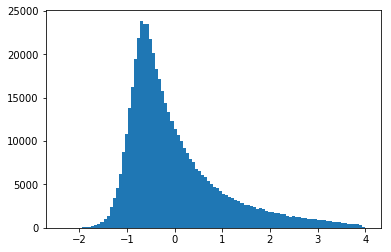

In [766]:
m = np.mean(normalized_ct_weights_sc,axis=0)[:,None]
s = np.std(normalized_ct_weights_sc,axis=0)[:,None]
signal_df = np.divide(np.subtract(normalized_ct_weights_sc.T,m),s).T
plt.hist(np.array(signal_df).ravel(),bins=100)
plt.show()

In [768]:
assigned_ct = []
values = []
for cell in signal_df.columns:
    ct = signal_df.sort_values(cell,ascending=False).index[0]
    v = signal_df[cell].loc[ct]
    values.append(v)
    assigned_ct.append(ct)
assigned_ct_df = pd.DataFrame(assigned_ct,index=normalized_ct_weights_sc.columns)
assigned_ct_df['values'] = values
assigned_ct_df


,0,values
0,MAC,3.189816
1,nODC,2.020506
2,MG,2.474612
3,ASC,3.246226
4,NeuroG2,2.346036
5,MG,2.359109
6,NeuroG2,2.245798
7,END,2.112506
8,SMC,3.363290
9,OPC,3.120854


/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


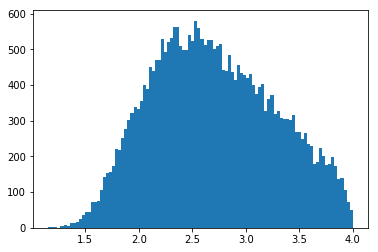

In [770]:
plt.hist(np.array(values),bins=100)
plt.show()

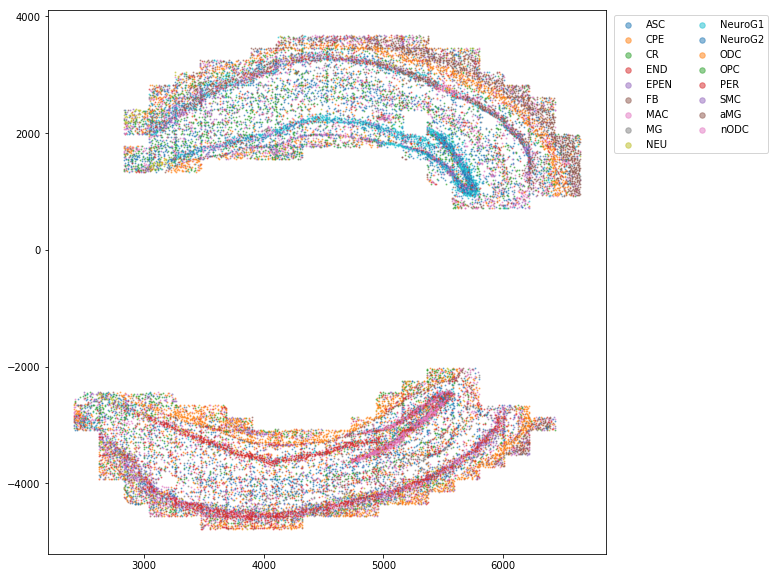

In [773]:
plt.figure(figsize=[10,10])
t = []
for cell in assigned_ct_df.index:
    if assigned_ct_df['values'].loc[cell]>3.5:
        t.append(assigned_ct_df[0].loc[cell])
    else:
        t.append(post_adata6['cell_type'].loc[cell])
post_adata6['temp_cell_type'] = t
cell_types = post_adata6['temp_cell_type'].unique()
cell_types.sort()
for ct in cell_types:
    temp_df = cell_info_df.loc[list(post_adata6[post_adata6['temp_cell_type']==ct].index)]
    plt.scatter(temp_df.stage_x,temp_df.stage_y,s=1,alpha=0.5,label=ct)
lgnd = plt.legend(bbox_to_anchor=(0.8, 0.5, 0.5, 0.5),ncol=2)
for i in range(len(lgnd.legendHandles)):
    lgnd.legendHandles[i]._sizes = [30]
plt.show()

In [751]:
cts = []
ccs = []
for ct,cc in Counter(assigned_ct).items():
    cts.append(ct)
    ccs.append(cc)
ct_comp = pd.DataFrame(ccs,index=cts)
ct_comp['%'] = 100*ct_comp/np.sum(ct_comp[0])
ct_comp.sort_values(0,ascending=False)

,0,%
ODC,2979,10.046879
MAC,2950,9.949074
ASC,2943,9.925466
PER,2597,8.758558
MG,2287,7.713062
EPEN,2003,6.755253
aMG,1897,6.397761
NeuroG1,1774,5.982935
NeuroG2,1706,5.753600
FB,1558,5.254460


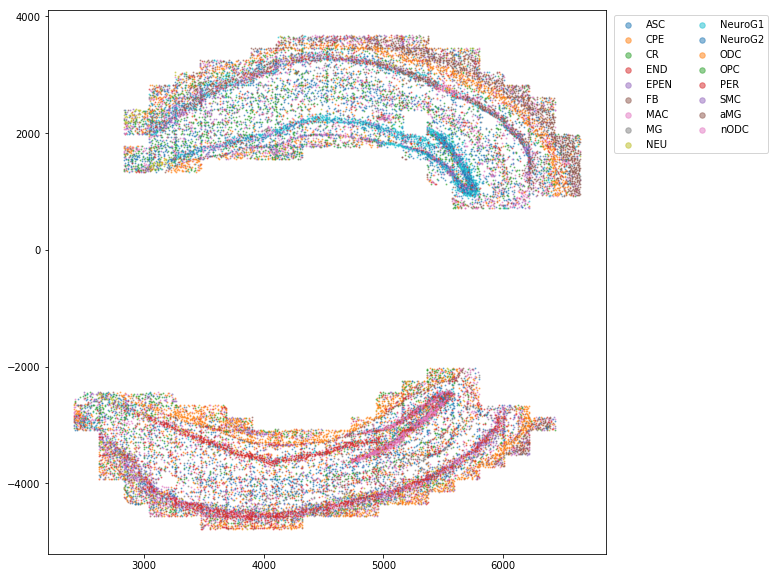

In [752]:
plt.figure(figsize=[10,10])
post_adata6['cell_type'] = assigned_ct_df
cell_types = post_adata6['cell_type'].unique()
cell_types.sort()
for ct in cell_types:
    temp_df = cell_info_df.loc[list(post_adata6[post_adata6['cell_type']==ct].index)]
    plt.scatter(temp_df.stage_x,temp_df.stage_y,s=1,alpha=0.5,label=ct)
lgnd = plt.legend(bbox_to_anchor=(0.8, 0.5, 0.5, 0.5),ncol=2)
for i in range(len(lgnd.legendHandles)):
    lgnd.legendHandles[i]._sizes = [30]
plt.show()

In [680]:
weights = pd.DataFrame(index = cluster_profiles.columns)
for ct in normalized_cell_type_profiles.columns:
    weights[ct] = list(np.multiply(cluster_profiles,normalized_cell_type_profiles[ct][:,None]).sum())
predicted_cell_types = []
for cell,row in weights.iterrows():
    predicted_cell_types.append(row.sort_values().index[-1])
predicted_cell_types_df = pd.DataFrame(predicted_cell_types,index=weights.index)
post_adata6['cell_type'] = [predicted_cell_types_df[0].loc[i] for i in post_adata6['louvain_r4']]
cell_info_df['cell_type'] = post_adata6['cell_type']

In [681]:
Counter(predicted_cell_types)

Counter({'MAC': 3,
         'nODC': 2,
         'aMG': 4,
         'ASC': 12,
         'ODC': 1,
         'MG': 1,
         'CR': 5,
         'SMC': 4,
         'NEU': 5,
         'END': 3,
         'CPE': 3,
         'NeuroG2': 2,
         'NeuroG1': 1})

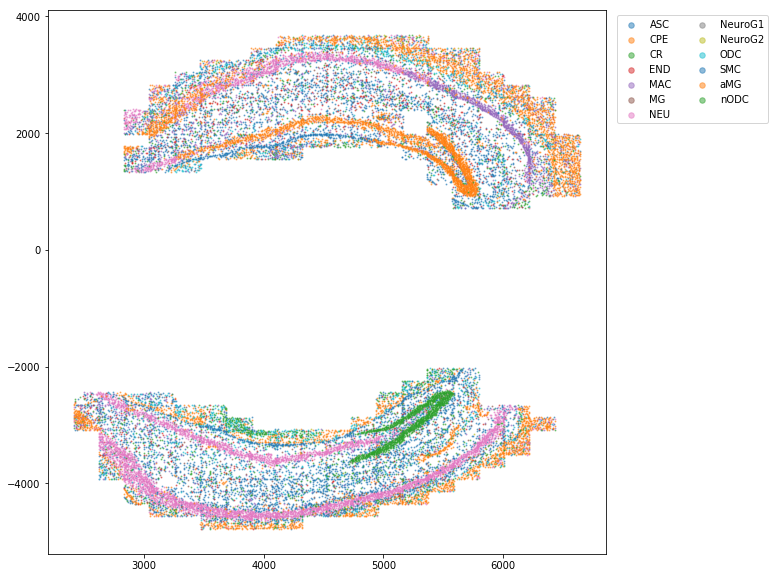

In [679]:
plt.figure(figsize=[10,10])
cell_types = post_adata6['cell_type'].unique()
cell_types.sort()
for ct in cell_types:
    temp_df = cell_info_df.loc[list(post_adata6[post_adata6['cell_type']==ct].index)]
    plt.scatter(temp_df.stage_x,temp_df.stage_y,s=1,alpha=0.5,label=ct)
lgnd = plt.legend(bbox_to_anchor=(0.8, 0.5, 0.5, 0.5),ncol=2)
for i in range(len(lgnd.legendHandles)):
    lgnd.legendHandles[i]._sizes = [30]
plt.show()

In [568]:
normalized_cell_counts_df = np.divide(cell_counts_df,np.sum(cell_counts_df,axis=1)[:,None])
Zscore = (normalized_cell_counts_df-np.median(normalized_cell_counts_df,axis=0))/np.std(normalized_cell_counts_df,axis=0)


In [ ]:
used_genes = []
duplicate = []
ct_gene_dict = {}
for ct in cell_type_profiles_zscore.columns:
    genes = list(cell_type_profiles_zscore[cell_type_profiles_zscore[ct]>2].index)
    for gene in genes:
        if gene in used_genes:
            duplicate.append(gene)
        else:
            used_genes.append(gene)
for ct in cell_type_profiles_zscore.columns:
    genes = list(cell_type_profiles_zscore[cell_type_profiles_zscore[ct]>2].index)
    ct_genes = []
    for gene in genes:
        if not gene in duplicate:
            ct_genes.append(gene)
    ct_gene_dict[ct] = ct_genes
    print(ct,ct_genes)

In [550]:
marker_genes = pd.read_csv('/bigstore/binfo/mouse/Hippocampus/HippocampusCandidateProbesRound1updatedCountsIsoSpecFinal2.csv',index_col=0)
marker_genes

,Transcript ID,Probes,ProbesPassingSpec,Transcript Length,FPKM,CellType/Pathway/DEG,CellType,Timepoint,Reason,Source,...,UN1,EPEN,NEUG2,VSMC,NEUG1,MG,M?,VLMC2,UN3,VLMC1
Gene,,,,,,,,,,,,,,,,,,,,,
Ntrk2,ENSMUST00000109838,307,220,6846,36.208449,Pathway,Learning and Memory,NaN,Prior Knowledge,Fernando,...,4.583009,8.554933,2.725693,0.268779,0.636560,0.391281,0.266501,0.511212,3.355705,0.345364
Creb1,ENSMUST00000087366,281,279,8364,6.187597,Pathway,Learning and Memory,NaN,Prior Knowledge,Fernando,...,0.409159,0.321691,0.487591,0.894781,0.695814,0.925480,0.912144,0.269367,0.172470,0.759250
Pparg,ENSMUST00000171644,85,82,2125,0.084588,Pathway,Energy Production / Mitochondrial Function,NaN,Prior Knowledge,Fernando,...,0.054159,0.000000,0.125805,0.059418,0.104545,0.049136,0.264066,0.597403,0.000000,0.041377
Tfam,ENSMUST00000092430,154,153,4167,4.641188,Pathway,Energy Production / Mitochondrial Function,NaN,Prior Knowledge,Fernando,...,0.189458,0.112137,0.325652,0.179004,0.431915,0.322137,0.156413,0.258677,0.142459,0.477474
Ckmt1,ENSMUST00000000317,89,89,1620,42.730316,Pathway,Energy Production / Mitochondrial Function,NaN,Prior Knowledge,Fernando,...,0.892181,0.000000,0.000000,0.096180,0.000000,0.015353,0.000000,0.000000,0.411110,0.000000
Igf1,ENSMUST00000095360,205,202,7052,1.119608,Pathway,Energy Production / Mitochondrial Function,NaN,Prior Knowledge,Fernando,...,0.257880,0.000000,0.000000,0.000000,0.000000,0.000000,2.886093,0.831601,0.420292,1.132869
Insr,ENSMUST00000091291,414,404,9355,0.679258,Pathway,Energy Production / Mitochondrial Function,NaN,Prior Knowledge,Fernando,...,0.465269,0.727339,0.432990,0.074626,1.175048,0.659415,0.205463,0.248752,0.062390,0.468768
Thra,ENSMUST00000064187,112,112,2452,118.654064,Pathway,Thyroid Hormone,NaN,Prior Knowledge,Fernando,...,13.323020,1.765367,1.314534,1.984400,3.535598,0.523027,0.719700,0.597740,3.163729,1.927943
Mapt,ENSMUST00000106992,272,272,5253,32.671307,Pathway,Alzheimer's Disease,NaN,Prior Knowledge,Fernando,...,3.891929,0.105993,1.693910,0.134619,5.924418,0.311846,0.440577,0.206612,8.090347,0.266700


In [552]:
for ct in marker_genes.CellType.unique():
    marker_genes[(marker_genes['CellType/Pathway/DEG']=='Marker Gene')&
                 (marker_genes['CellType']==ct)]

In [369]:
normalized_cell_counts_df = np.divide(cell_counts_df[merfished_genes],np.sum(cell_counts_df[merfished_genes],axis=1)[:,None]).T
normalized_cell_counts_df

,0,1,2,3,4,5,6,7,8,9,...,29641,29642,29643,29644,29645,29646,29647,29648,29649,29650
A730060N03Rik,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
A830036E02Rik,0.000000,0.005155,0.001916,0.000000,0.000000,0.000000,0.002994,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.005917,0.013575,0.000000,0.00000,0.000000,0.000000,0.000000,0.006494
Abcb1a,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
Adamts9,0.003876,0.000000,0.001916,0.000000,0.003247,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.005587,0.000000,0.000000,0.000000
Aqp4,0.000000,0.005155,0.000000,0.000000,0.003247,0.010526,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
Arap2,0.003876,0.000000,0.003831,0.000000,0.003247,0.000000,0.011976,0.000000,0.005731,0.000000,...,0.00000,0.004348,0.000000,0.009050,0.019608,0.00000,0.005587,0.000000,0.000000,0.006494
Asb7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.004348,0.000000,0.000000,0.000000,0.00000,0.000000,0.009434,0.000000,0.000000
Atf6,0.000000,0.000000,0.011494,0.000000,0.019481,0.000000,0.008982,0.000000,0.005731,0.000000,...,0.00000,0.000000,0.005917,0.000000,0.009804,0.00000,0.005587,0.000000,0.000000,0.000000
Bbs1,0.000000,0.005155,0.019157,0.000000,0.003247,0.010526,0.000000,0.000000,0.000000,0.005435,...,0.00000,0.000000,0.005917,0.000000,0.009804,0.00000,0.000000,0.000000,0.000000,0.006494
Bcan,0.116279,0.092784,0.028736,0.211111,0.035714,0.168421,0.044910,0.134247,0.034384,0.125000,...,0.06250,0.126087,0.023669,0.013575,0.019608,0.06250,0.134078,0.000000,0.156522,0.116883


In [431]:
median = np.median(normalized_cell_counts_df.loc[merfished_genes],axis=1)
std = np.std(normalized_cell_counts_df.loc[merfished_genes],axis=1)
z_score_cell_counts_df = np.divide(np.subtract(normalized_cell_counts_df,median[:,None]),std[:,None])
z_score_cell_counts_df

,0,1,2,3,4,5,6,7,8,9,...,29641,29642,29643,29644,29645,29646,29647,29648,29649,29650
A730060N03Rik,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
A830036E02Rik,0.000000,1.465695,0.544722,0.000000,0.000000,0.000000,0.851332,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.682514,3.859884,0.000000,0.000000,0.000000,0.000000,0.000000,1.846395
Abcb1a,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Adamts9,2.393309,0.000000,1.182900,0.000000,2.004785,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.449574,0.000000,0.000000,0.000000
Aqp4,0.000000,1.963818,0.000000,0.000000,1.236951,4.010324,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Arap2,0.017993,-0.580289,0.011117,-0.580289,-0.079130,-0.580289,1.268296,-0.580289,0.304277,-0.580289,...,-0.580289,0.090828,-0.580289,0.816605,2.446315,-0.580289,0.282040,-0.580289,-0.580289,0.422028
Asb7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.943279,0.000000,0.000000,0.000000,0.000000,0.000000,4.216549,0.000000,0.000000
Atf6,-0.362429,-0.362429,0.620711,-0.362429,1.303802,-0.362429,0.405833,-0.362429,0.127733,-0.362429,...,-0.362429,-0.362429,0.143685,-0.362429,0.476132,-0.362429,0.115410,-0.362429,-0.362429,-0.362429
Bbs1,-0.397155,0.534316,3.064635,-0.397155,0.189551,1.505007,-0.397155,-0.397155,-0.397155,0.584940,...,-0.397155,-0.397155,0.672108,-0.397155,1.374467,-0.397155,-0.397155,-0.397155,-0.397155,0.776257
Bcan,1.023894,0.715138,-0.126516,2.270083,-0.034809,1.709092,0.086034,1.260005,-0.052291,1.138496,...,0.317182,1.152780,-0.193101,-0.325746,-0.246464,0.317182,1.257793,-0.504131,1.552723,1.031832


In [518]:
normalized_cell_type_profiles = cell_type_profiles/np.sum(cell_type_profiles,axis=0)
normalized_cell_type_profiles

,ODC,ASC,NEU,aMG,END,MG,OPC,CPE,PER,SMC,nODC,CR,NeuroG1,MAC,FB,NeuroG2,EPEN
A730060N03Rik,0.000015,0.000021,0.000143,0.000085,0.000045,0.000097,0.000022,0.000047,0.000061,0.000105,0.000010,0.000122,0.000056,0.000080,0.000025,0.000022,0.000082
A830036E02Rik,0.000038,0.000066,0.002379,0.000047,0.000028,0.000071,0.000097,0.000102,0.000050,0.000104,0.000028,0.000430,0.000410,0.000032,0.000016,0.000088,0.000146
Abcb1a,0.001171,0.000558,0.000712,0.000715,0.039984,0.001112,0.000463,0.001499,0.001789,0.001349,0.000348,0.000907,0.001633,0.002072,0.002539,0.000722,0.000997
Adamts9,0.000110,0.000599,0.000259,0.000461,0.002750,0.000411,0.000547,0.000187,0.000467,0.000610,0.000077,0.000280,0.000626,0.001054,0.000996,0.000971,0.000382
Aqp4,0.000717,0.026468,0.000585,0.001128,0.001054,0.001163,0.001478,0.001434,0.000474,0.000529,0.000408,0.000065,0.000462,0.000536,0.001243,0.001216,0.026230
Arap2,0.007168,0.004114,0.003670,0.001575,0.004294,0.001947,0.003564,0.001135,0.002771,0.001497,0.005577,0.001123,0.003226,0.002238,0.002624,0.004874,0.002249
Asb7,0.002648,0.001469,0.001070,0.000771,0.000746,0.001484,0.001339,0.001243,0.000710,0.000423,0.001693,0.000740,0.001071,0.000643,0.000581,0.000951,0.001232
Atf6,0.002373,0.001730,0.002892,0.003940,0.002408,0.004937,0.002065,0.003341,0.002186,0.002131,0.002393,0.001878,0.002674,0.005439,0.003242,0.002297,0.003972
Bbs1,0.000200,0.000267,0.000825,0.000171,0.000253,0.000260,0.000420,0.000667,0.000112,0.000167,0.000288,0.000420,0.000542,0.000184,0.000183,0.000404,0.001566
Bcan,0.002619,0.020002,0.002414,0.000812,0.000548,0.001026,0.018155,0.000746,0.000898,0.000689,0.015326,0.000749,0.001678,0.000296,0.000420,0.007808,0.003159


In [573]:
normalized_cell_type_profiles = cell_type_profiles_zscore/np.sum(cell_type_profiles_zscore,axis=0)
normalized_cell_type_profiles

,ODC,ASC,NEU,aMG,END,MG,OPC,CPE,PER,SMC,nODC,CR,NeuroG1,MAC,FB,NeuroG2,EPEN
A730060N03Rik,-0.009782,-0.002023,1.872834e-02,0.021265,0.004807,0.018410,-0.001333,0.000169,0.018687,0.032691,-0.004973,0.015856,0.002939,0.011762,-0.000871,-0.003283,0.006760
A830036E02Rik,-0.000250,0.000557,2.094956e-02,-0.000362,-0.000460,-0.000010,0.000696,0.000535,0.000345,0.001417,-0.000161,0.003651,0.003230,-0.000850,-0.000449,0.000368,0.000732
Abcb1a,0.001540,-0.000158,-3.662433e-07,-0.000559,0.066024,-0.000091,-0.000240,0.000468,0.002634,0.001203,-0.000392,0.000104,0.000489,0.001414,0.002390,-0.000194,0.000022
Adamts9,-0.006655,0.006304,-2.542083e-04,0.001317,0.045616,-0.001186,0.003022,-0.004475,0.005477,0.006736,-0.002944,-0.000292,0.001905,0.010260,0.010323,0.006264,-0.000084
Aqp4,0.000094,0.045491,-8.078619e-05,0.000353,0.000468,0.000043,0.000855,0.000438,-0.000271,-0.000297,-0.000281,-0.000543,-0.000368,-0.001069,0.000748,0.000308,0.017802
Arap2,0.055515,0.007728,9.979262e-04,-0.027260,0.003609,-0.024779,0.001306,-0.026159,-0.000812,-0.014536,0.019290,-0.008270,-0.004234,-0.024032,-0.004112,0.002113,-0.006698
Asb7,0.075899,0.011869,-5.231930e-05,-0.021235,-0.011501,-0.006473,0.004289,-0.010248,-0.006629,-0.017037,0.018342,-0.004641,-0.004138,-0.027385,-0.009313,-0.006106,-0.002156
Atf6,0.004833,-0.009068,6.412031e-03,0.023146,-0.004677,0.028243,-0.002573,-0.008057,0.007777,-0.003351,0.011499,-0.006719,-0.004737,0.038069,0.018495,-0.009524,0.008810
Bbs1,-0.006008,0.003997,2.034906e-02,-0.015845,-0.001441,-0.010267,0.009269,0.018651,-0.009923,-0.006168,0.006856,0.005957,0.007748,-0.017199,-0.003531,0.004266,0.040719
Bcan,0.004584,0.042433,7.791896e-04,-0.003930,-0.002914,-0.003515,0.023019,-0.003539,-0.001429,-0.002255,0.030141,-0.001023,-0.000508,-0.005312,-0.002105,0.007305,0.000899


In [574]:
weights = pd.DataFrame(index = z_score_cell_counts_df.columns)
for ct in normalized_cell_type_profiles.columns:
    weights[ct] = list(np.multiply(z_score_cell_counts_df,normalized_cell_type_profiles[ct][:,None]).sum())
#     weights[ct] = list(np.multiply(normalized_cell_counts_df,normalized_cell_type_profiles[ct][:,None]).sum())
#     weights[ct] = list(np.multiply(normalized_cell_counts_df,normalized_cell_type_profiles[ct][:,None]).sum())

In [575]:
predicted_cell_types = []
for cell,row in weights.iterrows():
    predicted_cell_types.append(row.sort_values().index[-1])


In [576]:
cts = []
ccs = []
for ct,cc in Counter(predicted_cell_types).items():
    cts.append(ct)
    ccs.append(cc)
ct_comp = pd.DataFrame(ccs,index=cts)
ct_comp['%'] = 100*ct_comp/np.sum(ct_comp[0])
ct_comp.sort_values(0,ascending=False)

,0,%
CPE,4334,14.616708
ASC,4089,13.790429
ODC,3008,10.144683
aMG,2626,8.856362
MAC,2586,8.721460
nODC,2205,7.436511
SMC,1875,6.323564
MG,1640,5.531011
NEU,1170,3.945904
END,990,3.338842


In [545]:
cts = []
ccs = []
for ct,cc in Counter(info_df.cell_type).items():
    cts.append(ct)
    ccs.append(cc)
ct_comp = pd.DataFrame(ccs,index=cts)
ct_comp['%'] = 100*ct_comp/np.sum(ct_comp[0])
ct_comp.sort_values(0,ascending=False)

,0,%
ODC,5808,20.018612
ASC,4599,15.851515
NEU,4270,14.717540
END,3914,13.490504
aMG,2641,9.102816
OPC,2018,6.955503
MG,1801,6.207562
CPE,910,3.136525
nODC,531,1.830214
MAC,513,1.768173


In [577]:

cell_info_df['scRNAseq_score_cell_type'] = predicted_cell_types
cell_info_df

,stage_x,stage_y,pos,pixel_x,pixel_y,z,louvain_r0.5,imputed_cell_type,scRNAseq_score_cell_type
0,6394.132364,1114.336273,Pos290,1707.636364,1773.727273,13.090909,3,ASC,MAC
1,5155.304571,1811.363929,Pos187,1956.922674,425.357143,13.857143,0,ASC,nODC
2,5346.885846,3366.115231,Pos214,1778.769231,1147.846154,14.000000,5,ASC,MG
3,4844.659750,2783.026750,Pos173,1042.750000,1605.750000,7.250000,0,ASC,ASC
4,3902.601333,1870.788133,Pos103,143.131498,970.533333,16.266667,3,ASC,MAC
5,4942.000000,3040.035231,Pos175,1935.779817,92.066337,14.000000,0,ASC,ASC
6,5097.412200,1931.799067,Pos187,1425.800000,1530.266667,13.600000,3,ASC,ODC
7,5809.660786,1062.193929,Pos265,217.071429,1295.357143,14.714286,0,ASC,PER
8,6185.118429,1718.683429,Pos283,1725.857143,1510.857143,13.142857,3,ASC,CPE
9,5240.370312,1778.080000,Pos207,801.562500,120.000000,12.500000,9,ASC,MG


In [578]:
for i in cell_info_df['louvain_r0.5'].unique():
    m = mode(cell_info_df[cell_info_df['louvain_r0.5']==i].scRNAseq_score_cell_type)[0][0]
    print(i,m)

3 MAC
0 ASC
5 aMG
9 MG
1 CPE
8 SMC
2 ODC
10 CPE
4 MAC
6 nODC
7 MG


In [487]:
Counter(predicted_cell_types)

Counter({'ASC': 19571,
         'aMG': 1836,
         'NEU': 1313,
         'nODC': 1730,
         'FB': 623,
         'ODC': 2372,
         'NeuroG1': 115,
         'MG': 391,
         'SMC': 826,
         'MAC': 55,
         'CR': 409,
         'EPEN': 74,
         'CPE': 274,
         'NeuroG2': 15,
         'OPC': 4,
         'END': 39,
         'PER': 4})

In [501]:
len(cell_counts_df)

29651

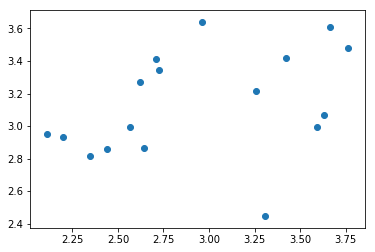

In [579]:
cc_dict = Counter(predicted_cell_types)
X = []
Y = []
for ct,cc in Counter(info_df.cell_type).items():
    X.append(cc)
    Y.append(cc_dict[ct])
plt.scatter(np.log10(X),np.log10(Y))
plt.show()

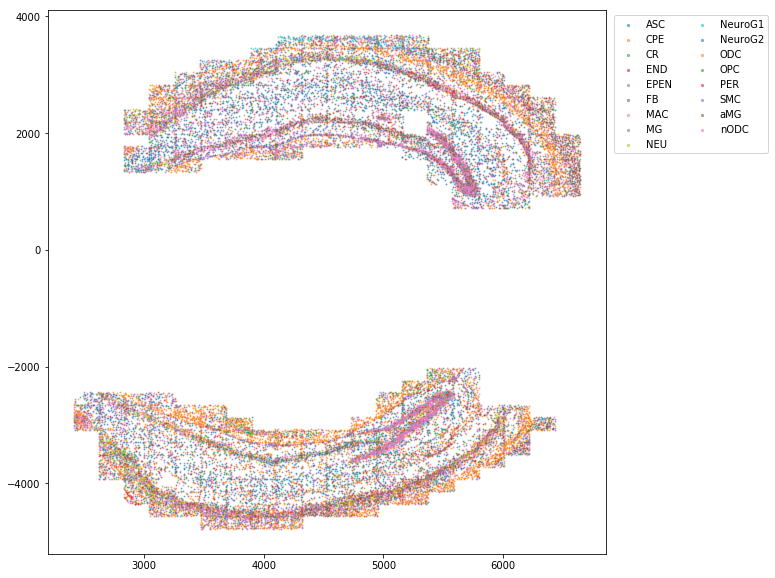

In [581]:
plt.figure(figsize=[10,10])
cell_types = cell_info_df['scRNAseq_score_cell_type'].unique()
cell_types.sort()
for ct in cell_types:
    temp_df = cell_info_df[cell_info_df['scRNAseq_score_cell_type']==ct]
    plt.scatter(temp_df.stage_x,temp_df.stage_y,s=1,alpha=0.5,label=ct)
lgnd = plt.legend(bbox_to_anchor=(0.8, 0.5, 0.5, 0.5),ncol=2)
for i in range(len(lgnd.legendHandles)):
    lgnd.legendHandles[i]._sizes = [5]
plt.show()

In [255]:
# MERISH compressed
compressed = pd.DataFrame(index=cell_counts_df.index)
for i in range(18):
    genes = list(binary_df[binary_df[i]==1].index)
    compressed[i] = np.sum(cell_counts_df[genes],axis=1)
MERFISH_compressed = compressed

In [313]:
# interpolate to MERFISH
from scipy.interpolate import interp1d
percentile = np.linspace(0,100,1000)
MERFISH_compressed_interpolated = compressed_df.copy()
for i in range(18):
    MERFISH_percentile = []
    intensity_percentile = []
    for p in percentile:
        MERFISH_percentile.append(np.percentile(MERFISH_compressed[i],p))
        intensity_percentile.append(np.percentile(compressed_df[i],p))
    f = interp1d(intensity_percentile,MERFISH_percentile,kind='linear')
    MERFISH_compressed_interpolated[i] = compressed_df[i].apply(f)
    

In [316]:
# knn in MERFISH
cell_info_df = pd.read_csv('/bigstore/GeneralStorage/Zach/CSI/cell_info_df.csv.gz',index_col=0)
cell_info_df

,stage_x,stage_y,pos,pixel_x,pixel_y,z,louvain_r0.5
0,6394.132364,1114.336273,Pos290,1707.636364,1773.727273,13.090909,3
1,5155.304571,1811.363929,Pos187,1956.922674,425.357143,13.857143,0
2,5346.885846,3366.115231,Pos214,1778.769231,1147.846154,14.000000,5
3,4844.659750,2783.026750,Pos173,1042.750000,1605.750000,7.250000,0
4,3902.601333,1870.788133,Pos103,143.131498,970.533333,16.266667,3
5,4942.000000,3040.035231,Pos175,1935.779817,92.066337,14.000000,0
6,5097.412200,1931.799067,Pos187,1425.800000,1530.266667,13.600000,3
7,5809.660786,1062.193929,Pos265,217.071429,1295.357143,14.714286,0
8,6185.118429,1718.683429,Pos283,1725.857143,1510.857143,13.142857,3
9,5240.370312,1778.080000,Pos207,801.562500,120.000000,12.500000,9


In [ ]:
cell_types_idx.loc[cell_info_df[cell_type_col].loc[rank[x,y]]].iloc[0]

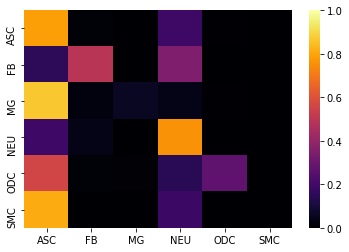

In [778]:
# # knn in MERFISH
import random
from sklearn.metrics.pairwise import euclidean_distances

border_xy = 100
border_z = 5
keepers = cell_info_df[(cell_info_df.z>0+border_z)&
                       (cell_info_df.z<cell_info_df.z.max()-border_z)&
                       (cell_info_df.pixel_x>0+border_xy)&
                       (cell_info_df.pixel_x<2048-border_xy)&
                       (cell_info_df.pixel_y>0+border_xy)&
                       (cell_info_df.pixel_y<2048-border_xy)].index

ref = MERFISH_compressed
mes = MERFISH_compressed_interpolated
reference = np.array(ref.copy())
measured = np.array(mes.copy())
cells = np.array(mes.index)
ref_cells = list(ref.index)
cell_info_df['cell_type'] = post_adata6['cell_type']
cell_type_col = 'cell_type'
k = 10
dist = euclidean_distances(reference, measured)
rank = dist.argpartition(k,axis=0)[:k,:]
metrics = []
correlations = []
cells_df = pd.DataFrame(index=cell_info_df.index)
cells_df['cell_type'] = cell_info_df[cell_type_col]
cell_types = list(cells_df.cell_type.unique())
cell_types.sort()
cell_types_idx = pd.DataFrame(list(range(len(cell_types))),index=cell_types)
cell_type_matrix = np.zeros_like(rank)
for x in range(rank.shape[0]):
    for y in range(rank.shape[1]):
        cell_type_matrix[x,y] = cell_types_idx.loc[cell_info_df[cell_type_col].loc[rank[x,y]]].iloc[0]
from scipy.stats import mode
# real = cell_type_matrix[0,:]
imputed = mode(cell_type_matrix[1:,:],axis=0).mode.T[:,0]
temp = pd.DataFrame(cell_types_idx.index,index=cell_types_idx[0])
imputed_cell_types = pd.DataFrame([temp.loc[i].iloc[0] for i in imputed],
                                  index=cells,columns=['imputed'])

real = list(cell_info_df[cell_type_col])
cell_info_df['imputed_cell_type'] = imputed_cell_types
cell_type_dict = {}
for idx in cell_types_idx[0]:
    cell_type_dict[idx] = []
correct = 0
for i,r in enumerate(real):
    if i in keepers:
        r = cell_types_idx[0].loc[r]
        cell_type_dict[r].append(imputed[i])
        if r == imputed[i]:
            correct+=1
        
confusion_matrix = np.zeros((len(cell_types),len(cell_types)))
for key,imlist in cell_type_dict.items():
    for cell_type,n in Counter(imlist).items():
        confusion_matrix[key,cell_type]= n/len(imlist)
%matplotlib inline
import seaborn as sns
sns.heatmap(pd.DataFrame(confusion_matrix,index=cell_types_idx.index,
                         columns = cell_types_idx.index),cmap='inferno',vmin=0,vmax=1)
plt.show()

In [781]:
correct/len(keepers)

0.6247615818251177

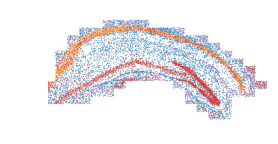

In [837]:

import matplotlib
matplotlib.rcParams['svg.fonttype'] = 'none'
border_xy = 100
border_z = 5
keepers = cell_info_df[(cell_info_df.z>0+border_z)&
                       (cell_info_df.z<cell_info_df.z.max()-border_z)&
                       (cell_info_df.pixel_x>0+border_xy)&
                       (cell_info_df.pixel_x<2048-border_xy)&
                       (cell_info_df.pixel_y>0+border_xy)&
                       (cell_info_df.pixel_y<2048-border_xy)].index
# keepers = cell_info_df.index
td = imputed_cell_types.loc[keepers]
plt.figure(figsize=[4,2])
for ct in cell_types:
    temp = list(td[td['imputed']==ct].index)
    temp_df = cell_info_df.loc[temp]
    plt.scatter(temp_df.stage_x,temp_df.stage_y,s=0.1,alpha=0.5,label=ct)
# lgnd = plt.legend(bbox_to_anchor=(0.95, 0.1705, 0.5, 0.5),ncol=1)
# for i in range(len(lgnd.legendHandles)):
#     lgnd.legendHandles[i]._sizes = [30]
plt.ylim([-2000,-5000])
plt.xlim([2500,6500])
plt.axis('off')
# plt.tight_layout()
plt.savefig('/bigstore/GeneralStorage/Zach/CSI/Grant_Figures/Imputed_cell_types.pdf')
plt.savefig('/bigstore/GeneralStorage/Zach/CSI/Grant_Figures/Imputed_cell_types.eps')
plt.savefig('/bigstore/GeneralStorage/Zach/CSI/Grant_Figures/Imputed_cell_types.svg')

plt.show()

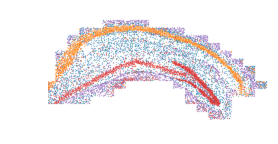

In [838]:
import matplotlib
matplotlib.rcParams['svg.fonttype'] = 'none'
plt.figure(figsize=[4,2])
ct_col = 'cell_type'
cts = list(cell_info_df[ct_col].unique())
cts.sort()
border_z = 5
border_xy = 100
keepers = cell_info_df[(cell_info_df.z>0+border_z)&
                       (cell_info_df.z<cell_info_df.z.max()-border_z)&
                       (cell_info_df.pixel_x>0+border_xy)&
                       (cell_info_df.pixel_x<2048-border_xy)&
                       (cell_info_df.pixel_y>0+border_xy)&
                       (cell_info_df.pixel_y<2048-border_xy)].index
# keepers = cell_info_df.index
td = cell_info_df.loc[keepers]
for ct in cts:
    temp_df = td[td[ct_col]==ct]
    plt.scatter(temp_df.stage_x,temp_df.stage_y,s=0.1,alpha=0.5,label=ct)
# lgnd = plt.legend(bbox_to_anchor=(0.95, 0.1705, 0.5, 0.5),ncol=1)
# for i in range(len(lgnd.legendHandles)):
#     lgnd.legendHandles[i]._sizes = [30]
plt.ylim([-2000,-5000])
plt.xlim([2500,6500])
plt.axis('off')
# plt.tight_layout()
plt.savefig('/bigstore/GeneralStorage/Zach/CSI/Grant_Figures/MERFISH_cell_types.pdf')
plt.savefig('/bigstore/GeneralStorage/Zach/CSI/Grant_Figures/MERFISH_cell_types.eps')
plt.savefig('/bigstore/GeneralStorage/Zach/CSI/Grant_Figures/MERFISH_cell_types.svg')

plt.show()

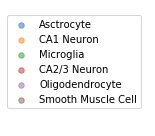

In [845]:
matplotlib.rcParams['svg.fonttype'] = 'none'
plt.figure(figsize=[2,2])
cts = ['Asctrocyte','CA1 Neuron','Microglia','CA2/3 Neuron','Oligodendrocyte','Smooth Muscle Cell']
for ct in cts:
    plt.scatter(0,0,s=0.001,alpha=0.5,label=ct)
lgnd = plt.legend()#bbox_to_anchor=(0.95, 0.1705, 0.5, 0.5),ncol=1)
for i in range(len(lgnd.legendHandles)):
    lgnd.legendHandles[i]._sizes = [30]
plt.ylim([-2000,-5000])
plt.xlim([2500,6500])
plt.axis('off')
plt.tight_layout()
plt.savefig('/bigstore/GeneralStorage/Zach/CSI/Grant_Figures/Legend_cell_types.pdf')
plt.savefig('/bigstore/GeneralStorage/Zach/CSI/Grant_Figures/Legend_cell_types.eps')
plt.savefig('/bigstore/GeneralStorage/Zach/CSI/Grant_Figures/Legend_cell_types.svg')

plt.show()

In [333]:
real = list(cell_info_df['louvain_r0.5'])
cell_info_df['imputed_cell_type'] = imputed_cell_types
cell_type_dict = {}
for idx in cell_types_idx[0]:
    cell_type_dict[idx] = []
correct = 0
for i,r in enumerate(real):
    cell_type_dict[r].append(imputed[i])
    if r == imputed[i]:
        correct+=1
        
confusion_matrix = np.zeros((len(cell_types),len(cell_types)))
for key,imlist in cell_type_dict.items():
    for cell_type,n in Counter(imlist).items():
        confusion_matrix[key,cell_type]= n/len(imlist)

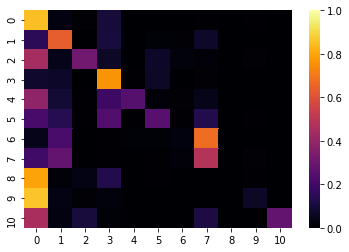

In [336]:
%matplotlib inline
import seaborn as sns
sns.heatmap(pd.DataFrame(confusion_matrix,index=cell_types_idx.index,
                         columns = cell_types_idx.index),cmap='inferno',vmin=0,vmax=1)
plt.show()

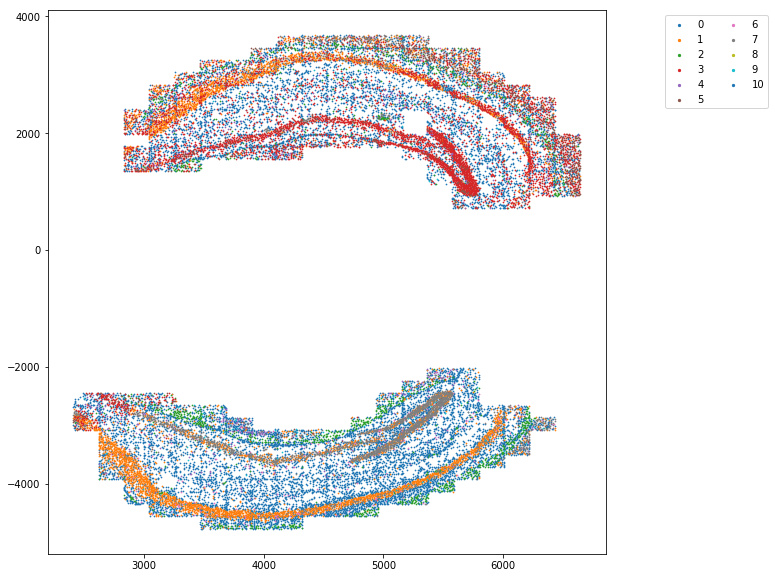

In [330]:
plt.figure(figsize=[10,10])
for ct in cell_types:
    temp = list(imputed_cell_types[imputed_cell_types['imputed']==ct].index)
    temp_df = cell_info_df.loc[temp]
    plt.scatter(temp_df.stage_x,temp_df.stage_y,s=0.5,label=ct)
lgnd = plt.legend(bbox_to_anchor=(0.8, 0.5, 0.5, 0.5),ncol=2)
for i in range(len(lgnd.legendHandles)):
    lgnd.legendHandles[i]._sizes = [5]
plt.show()

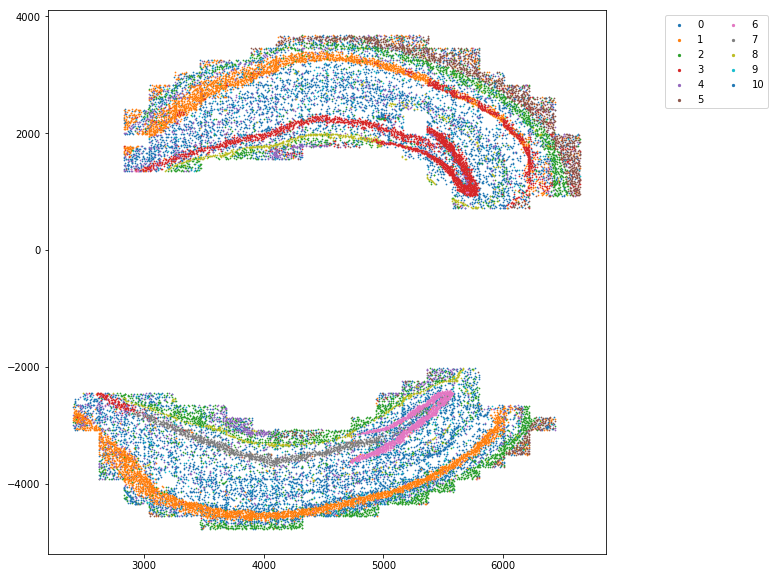

In [328]:
plt.figure(figsize=[10,10])
cts = list(cell_info_df['louvain_r0.5'].unique())
cts.sort()
for ct in cts:
    temp_df = cell_info_df[cell_info_df['louvain_r0.5']==ct]
    plt.scatter(temp_df.stage_x,temp_df.stage_y,s=0.5,label=ct)
lgnd = plt.legend(bbox_to_anchor=(0.8, 0.5, 0.5, 0.5),ncol=2)
for i in range(len(lgnd.legendHandles)):
    lgnd.legendHandles[i]._sizes = [5]
plt.show()